# Automating stem cell count

In [2]:
# --------- Mounting Drive and Installing Packages ---------

# Are we using Colab?
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

# If so, connect to Google account and install needed packages
if IN_COLAB:
    # We mount the drive
    from google.colab import drive
    drive.mount('/content/drive')
    ! ls drive/MyDrive/datasets/

    # We install the packages
    ! pip install czifile
    ! python -m pip install "napari[all]"
    ! python -m pip install -U scikit-image
    ! pip install pyclesperanto-prototype
    ! pip install lxml
    ! pip install stardist


In [143]:
# --------- Imports ---------

# General Imports
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch, Circle
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D

# Opening Images Imports
import czifile
from pathlib import Path
from lxml import etree


# Visualizing Images Imports
import napari
from napari.utils import nbscreenshot


# Filtering Images Imports
import skimage
import skimage.draw
from skimage import morphology
from skimage import img_as_float
from skimage import exposure
from skimage import filters
from skimage.morphology import reconstruction, disk, white_tophat, square, opening
from skimage.restoration import rolling_ball, denoise_bilateral
from skimage.filters import threshold_otsu
from skimage.measure import regionprops, regionprops_table

from scipy.ndimage import gaussian_filter
from pyclesperanto_prototype import imshow


# Image Segmentation Imports
from stardist.models import StarDist2D
from skimage.segmentation import find_boundaries

# Teselation Imports
from scipy.spatial import Voronoi, voronoi_plot_2d, distance

# Clustering Imports
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# Bounds for coloring the regions
from shapely.geometry import Polygon, box, GeometryCollection, Point, MultiPolygon, LineString
from shapely.validation import explain_validity, make_valid

# Additional Results
import statsmodels.api as sm
import networkx as nx
from scipy.spatial import Delaunay




In [4]:
if not IN_COLAB:
  %gui qt

In [5]:
# --------- Opening Images ---------

# Instantiate a Path object
if IN_COLAB:
  czi_file_path = Path(r"drive/MyDrive/datasets/ESTA - Sph1 Z Stack - CTRL SOX2.czi")
else:
  czi_file_path = Path(r"./data/Sph1 Z Stack - CTRL SOX2.czi")

# Read the image and get the CziFile object
with czifile.CziFile(czi_file_path) as czi:
    img = czi.asarray()  # Store image data in 'img' variable
    czi_object = czi  # Store the CziFile object



In [6]:
# I want the name of the czifile as a string
czi_file_name = os.path.basename(czi_file_path)
print(czi_file_name)

Sph1 Z Stack - CTRL SOX2.czi


In [7]:
czi.shape

(1, 1, 3, 1, 9, 2292, 2292, 1)

In [8]:
czi.axes

'BVCTZYX0'

So, according to this, `img` is an array of:
- B = 1, so one block
- V = 1, so one view
- C = 3, so three channels (which makes sense, they are the optic channel, the one indicating the nuclei and the SOX2 channel)
- T = 1, so a single time frame (i.e. no $t$ component)
- Z = 9, so 9 $z$ slices
- Y = 2292, so we have that many pixels in the $y$ direction (height)
- X = 2292, idem (note that we have a square image)
- '0' = 1, indicating that we have a single sample 


I also checked the metadata, and the spacing is the same than with Sph1.
```python
<Scaling>
      <Items>
        <Distance Id="X">
          <Value>1.2364633517553391e-007</Value>
        </Distance>
        <Distance Id="Y">
          <Value>1.2364633517553394e-007</Value>
        </Distance>
        <Distance Id="Z">
          <Value>1.9999999999999999e-006</Value>
        </Distance>
      </Items>
    </Scaling>
```

In [9]:
# --------- Getting rid of the extra dimensions ---------
image_squeezed = np.squeeze(img)
image_squeezed.shape

(3, 9, 2292, 2292)

In [10]:
# --------- Separating the channels ---------

# The first channel is the corresponding to stemness
stemness_channel = image_squeezed[0, :, :, :]
# Channel 2 is the optic one
optic_channel = image_squeezed[1, :, :, :]
# Channel 3 contains the nuclei
nuclei_channel = image_squeezed[2, :, :, :]

In [9]:
#@title Using Napari for Visualization

if not IN_COLAB:
  viewer = napari.Viewer()
  viewer.add_image(nuclei_channel, colormap='blue', blending='additive')
  viewer.add_image(stemness_channel, colormap='red', blending='additive')
  viewer.add_image(optic_channel, colormap='gray', blending='additive')
  print(viewer.layers)
  # We never close the napari window and can take a screenshot whenever we like
  nbscreenshot(viewer)

[<Image layer 'nuclei_channel' at 0x704363fff700>, <Image layer 'stemness_channel' at 0x704363fff8b0>, <Image layer 'optic_channel' at 0x7043605b00d0>]


In [11]:
# Z slice to analyze

z_slice = 4

## Stemness Channel

In [12]:
# --------- Processing the stemness channel ---------

stemness_array = np.copy(stemness_channel)

# Convert to float
stemness_floats_array = img_as_float(stemness_array)

h = 0.5

seed = stemness_floats_array - h
mask = stemness_floats_array

dilated = reconstruction(seed, mask, method='dilation')
hdome = stemness_floats_array - dilated

# Adaptive Equalization
hdome_adapteq = exposure.equalize_adapthist(hdome, clip_limit=0.03)

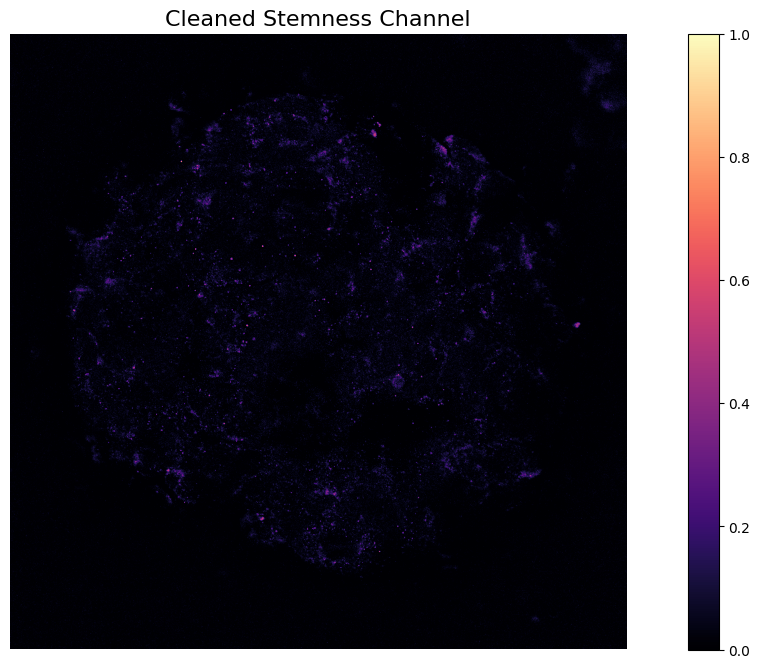

In [13]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(hdome_adapteq[z_slice], cmap='magma')
fig.colorbar(plt.cm.ScalarMappable(norm=None, cmap='magma'), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

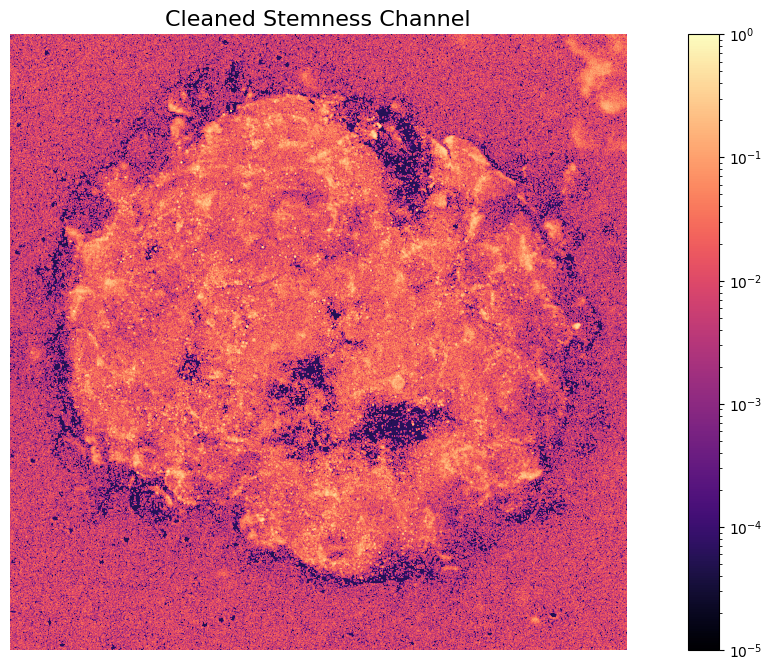

In [14]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))

norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())
cmap = 'magma'

ax.imshow(hdome_adapteq[z_slice], cmap=cmap, norm=norm)
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

Notar como en la región donde no hay nada, quedó un ruido apreciable, mucho mayor al que quedó luego de la limpieza al rededor de los objetos. Para tratar con esto es que luego uno le corta la cola inferior a la distribución de intensidad de fluorescencia.

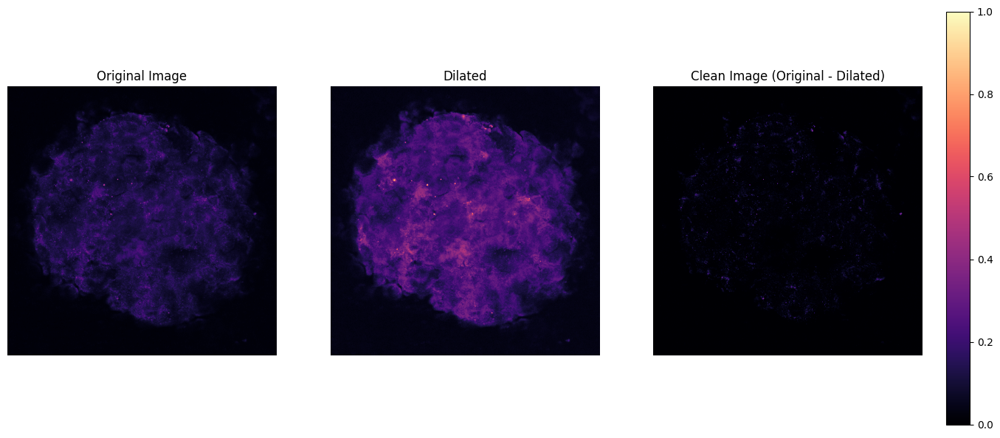

In [15]:
# Your existing code for setting up the figure and axes
fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(16, 8))

# First line for linear scale, second line for log scale
norm = None
# norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())

# Plot the images with log normalization
# cmap='bwr'
cmap='magma'

ax0.imshow(stemness_floats_array[z_slice], cmap=cmap, norm=norm)
ax0.set_title('Original Image')
ax0.axis('off')

ax1.imshow(dilated[z_slice], cmap=cmap, norm=norm) # , vmin=stemness_floats_array[z_slice].min(), vmax=stemness_floats_array[z_slice].max()
ax1.set_title('Dilated')
ax1.axis('off')

ax2.imshow(hdome[z_slice], cmap=cmap, norm=norm)
ax2.set_title('Clean Image (Original - Dilated)')
ax2.axis('off')

# Add colorbar with log normalization
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # left, bottom, width, height
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='vertical')

# fig.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make space for the colorbar

plt.show()

## Nuclei Channel

In [16]:
# 0. Converting the original image to float (originally it's a 'uint16')
image_3d = np.copy(nuclei_channel)
image_2d = image_3d[z_slice]

image_normalized = image_3d.astype(np.float32) / 65535.0

# 1. Adaptive Histogram Equalization on the 3D image
image_3d_equalized = exposure.equalize_adapthist(image_3d)

# 2. Extract a 2D slice from the equalized 3D image
image_2d_equalized = image_3d_equalized[z_slice]

# 3. Morphological opening to remove small noise
selem = morphology.disk(2)  # using a disk-shaped structuring element of radius 2
image_2d_opened = morphology.opening(image_2d_equalized, selem)
image_2d_opened = morphology.area_closing(image_2d_opened, area_threshold=150)

# 4. Bilateral Filtering (denoising without bluring edges)
image_opened_bilateral = denoise_bilateral(image_2d_opened, sigma_color=0.05, sigma_spatial=15)

# 5. Load pretrained StarDist 2D model for fluorescent images
model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Perform instance segmentation on the normalized binary image
labels, details = model.predict_instances(image_opened_bilateral)

# Extract boundaries from the labels
boundaries = find_boundaries(labels)

# ----------------------------------

# Overlay boundaries on the opened, filtered image
overlay = np.copy(image_opened_bilateral)
overlay[boundaries] = np.max(image_opened_bilateral)  # setting the boundary pixels to the maximum value of the image for visualization



Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


2023-12-27 12:19:54.200577: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-27 12:19:54.669262: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-27 12:19:58.153460: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.
2023-12-27 12:19:58.654903: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.
2023-12-27 12:19:59.120704: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.


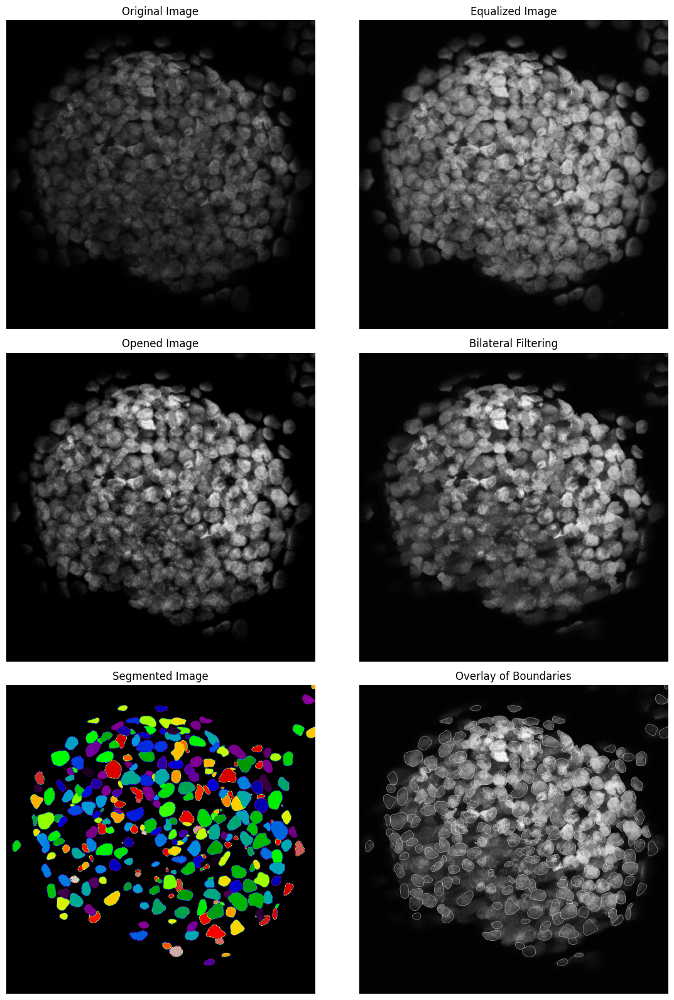

In [17]:
# --------- Visualize the result ---------


# Plotting the original, equalized, opened, and segmented images
fig, axes = plt.subplots(3, 2, figsize=(12, 16))
ax = axes.ravel()

ax[0].imshow(image_2d, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

ax[2].imshow(image_2d_opened, cmap='gray')
ax[2].set_title("Opened Image")
ax[2].axis('off')

ax[3].imshow(image_opened_bilateral, cmap='gray')
ax[3].set_title("Bilateral Filtering")
ax[3].axis('off')

ax[4].imshow(labels, cmap='nipy_spectral')
ax[4].set_title("Segmented Image")
ax[4].axis('off')

ax[5].imshow(overlay, cmap='gray')
ax[5].set_title("Overlay of Boundaries")
ax[5].axis('off')

plt.tight_layout()


# # Saving (Local)
# filename = "/slice_4/nuclei_processing.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)



plt.show()

### Generating the DataFrame

In [18]:
# --------- Generation of the DataFrame with geometrical properties of segmented objects ---------

spacing = (1.2364633517553391e-7, 1.2364633517553391e-7)  # in meters for (y, x) dimensions

properties = [
    "label", "area", "centroid", "equivalent_diameter", "bbox_area", "convex_area", "filled_area", "major_axis_length",
    "minor_axis_length", "bbox", "weighted_centroid", "coords",
    "eccentricity", "euler_number", "extent",
    "feret_diameter_max", "max_intensity", "mean_intensity", "min_intensity",
    "orientation", "perimeter", "solidity"
]

# Extract the region properties
regions = regionprops_table(labels, intensity_image=image_opened_bilateral, properties=properties) # , spacing=spacing

# Convert the result to a DataFrame
df = pd.DataFrame(regions)
df


,label,area,centroid-0,centroid-1,equivalent_diameter,bbox_area,convex_area,filled_area,major_axis_length,minor_axis_length,...,eccentricity,euler_number,extent,feret_diameter_max,max_intensity,mean_intensity,min_intensity,orientation,perimeter,solidity
0,1,2928.0,336.119536,1003.001366,61.057722,3888.0,3117.0,2928.0,75.252589,52.102354,...,0.721546,1,0.753086,77.252832,0.650847,0.366038,0.093204,1.367168,218.066017,0.939365
1,2,4097.0,1143.781792,725.897242,72.225082,5320.0,4160.0,4097.0,76.770961,68.162206,...,0.460105,1,0.770113,77.665951,0.542441,0.322416,0.082954,-1.286684,238.793939,0.984856
2,3,4783.0,1303.789672,1549.289985,78.037842,6960.0,4874.0,4783.0,100.779594,61.433336,...,0.792724,1,0.687213,105.261579,0.755263,0.549903,0.193432,-0.748998,274.936075,0.981330
3,4,5471.0,650.496801,610.031804,83.461929,7584.0,5552.0,5471.0,98.198499,71.280951,...,0.687815,1,0.721387,99.368003,0.550419,0.357820,0.147641,1.152111,281.563492,0.985411
4,5,4215.0,343.074259,1239.216845,73.257796,6448.0,4398.0,4215.0,100.105184,54.770636,...,0.837047,1,0.653691,104.479663,0.770128,0.574122,0.161743,1.427078,269.421356,0.958390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296,297,2519.0,1072.697896,1415.281064,56.632945,4779.0,2955.0,2519.0,79.073962,45.829585,...,0.814916,1,0.527098,83.198558,0.518417,0.323519,0.138507,-0.992561,227.965512,0.852453
297,298,6197.0,1978.480878,1259.691302,88.827166,8134.0,6281.0,6197.0,98.254018,80.705840,...,0.570353,1,0.761864,100.687636,0.190788,0.102544,0.031052,1.569849,297.078210,0.986626
298,299,116.0,898.706897,2046.241379,12.153016,156.0,124.0,116.0,13.623074,11.003209,...,0.589609,1,0.743590,14.317821,0.331281,0.211591,0.077986,-0.484516,38.970563,0.935484
299,300,1010.0,1099.429703,1021.994059,35.860451,1496.0,1070.0,1010.0,44.019700,29.895665,...,0.734006,1,0.675134,45.650849,0.468122,0.271263,0.088830,1.087937,127.539105,0.943925


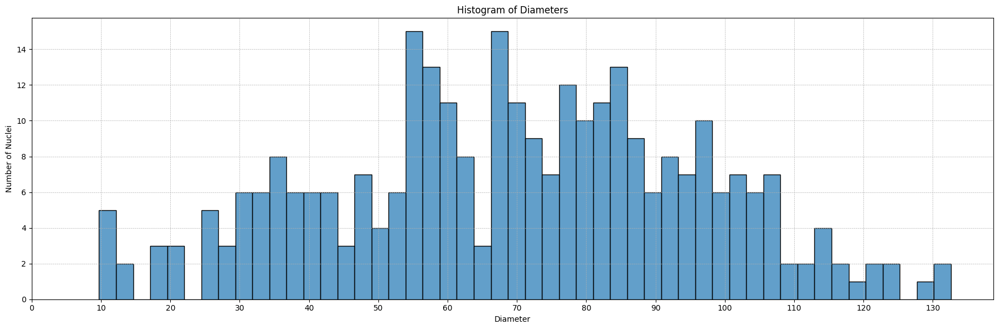

In [19]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='equivalent_diameter', bins=50, element='bars', stat='count', alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Diameters')
plt.xlabel('Diameter')
plt.ylabel('Number of Nuclei')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()


Podría cortar tomando sólo los objetos con diámetro > 24.

In [20]:
# --------- Voronoi Teselation ---------
# (including artificial points to limit cell regions)

# Centers of segmented nuclei
centroids = df[['centroid-1', 'centroid-0']].values

# Calculate the center and the radius for the large circle
center_of_spheroid = np.mean(centroids, axis=0)
total_spheroid_radius = np.max(np.sqrt(np.sum((centroids - center_of_spheroid)**2, axis=1)))

# Define the radius of the large bounding circle
gamma = 1.2
large_circle_radius = gamma * total_spheroid_radius

# Generate 50 points on the large circle
num_artificial_points = 100
angles = np.linspace(0, 2 * np.pi, num_artificial_points, endpoint=False)
artificial_points_x = center_of_spheroid[0] + large_circle_radius * np.cos(angles)
artificial_points_y = center_of_spheroid[1] + large_circle_radius * np.sin(angles)
artificial_points = np.stack((artificial_points_x, artificial_points_y), axis=1)

# Combine the original centroids with the artificial points
all_points = np.vstack((centroids, artificial_points))

# Calculate the Voronoi diagram for the combined points
vor = Voronoi(all_points)

In [21]:
# --------- Counting Fluorescence Intensity in each region ---------
# (excluding artificial points)

sox2_img = hdome[z_slice]
# sox2_img = average_hdome_adapteq

# Create a blank image for Voronoi segmentation
voronoi_regions = np.zeros_like(sox2_img, dtype=int)

intensity_sums = [0] * len(centroids)  # Initialize intensity sums with zeros

# Iterate through each original point's region
for point_idx, region_idx in enumerate(vor.point_region[:len(centroids)]):  # Only original points
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon_points = [vor.vertices[i] for i in region]
        polygon = Polygon(polygon_points)

        # Fix any invalid polygons
        if not polygon.is_valid:
            polygon = polygon.buffer(0)

        # Draw the polygon to get the region
        rr, cc = skimage.draw.polygon(polygon.exterior.xy[1], polygon.exterior.xy[0], voronoi_regions.shape)
        voronoi_regions[rr, cc] = point_idx + 1  # Add 1 to avoid using zero as a label
        intensity_sums[point_idx] += np.sum(sox2_img[rr, cc])  # Update the intensity sum for this region

# Add the intensity sums to the dataframe
df['Fluorescence_Intensity'] = intensity_sums

In [22]:
# --------- Defining in_spheroid cells ---------
# We consider cells to be in the spheroid if they are within a certain radius from the center.

# 1. Calculate center_of_spheroid FOR IN_SPHEROID (DIFFERENT FROM THE ONE FOR THE ARTIFICIAL POINTS)
center_of_spheroid_aux = df[['centroid-0', 'centroid-1']].mean().values
# we move the center a bit to the bottom left
center_of_spheroid_aux[0] += 100
center_of_spheroid_aux[1] -= 100

# 2. Calculate total_spheroid_radius
df['distance_to_center'] = np.sqrt((df['centroid-0'] - center_of_spheroid_aux[0])**2 + 
                                   (df['centroid-1'] - center_of_spheroid_aux[1])**2)
total_spheroid_radius = df['distance_to_center'].max()

# 3. Define alpha and add the 'in_spheroid' column
alpha = 0.55

df['in_spheroid'] = df['distance_to_center'] <= alpha * total_spheroid_radius

# Display counts
df['in_spheroid'].value_counts()


in_spheroid
True     252
False     49
Name: count, dtype: int64

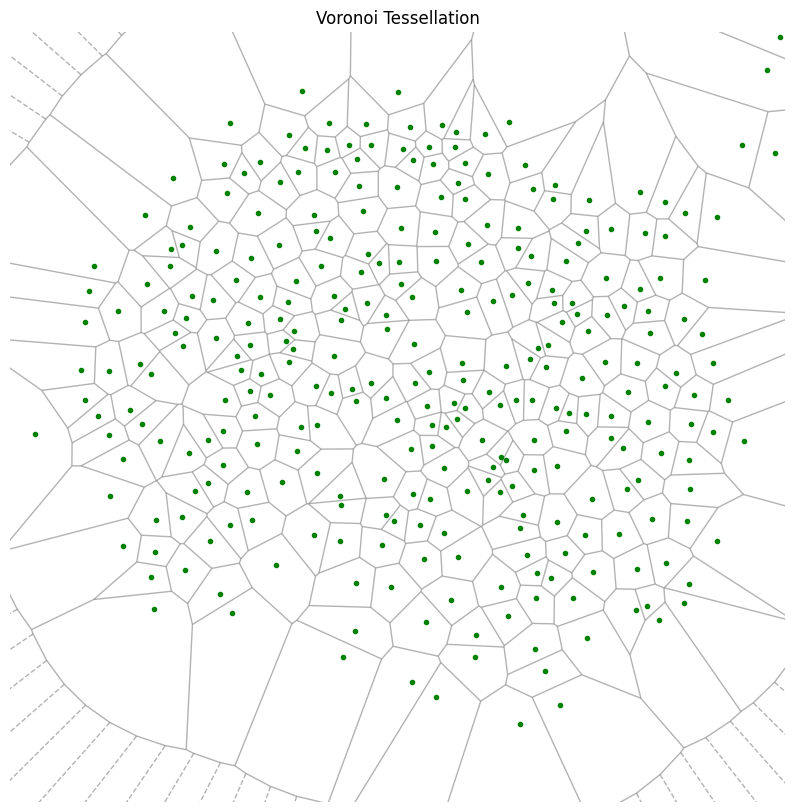

In [23]:
# --------- Voronoi Tessellation ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation')
plt.axis('off')

plt.show()

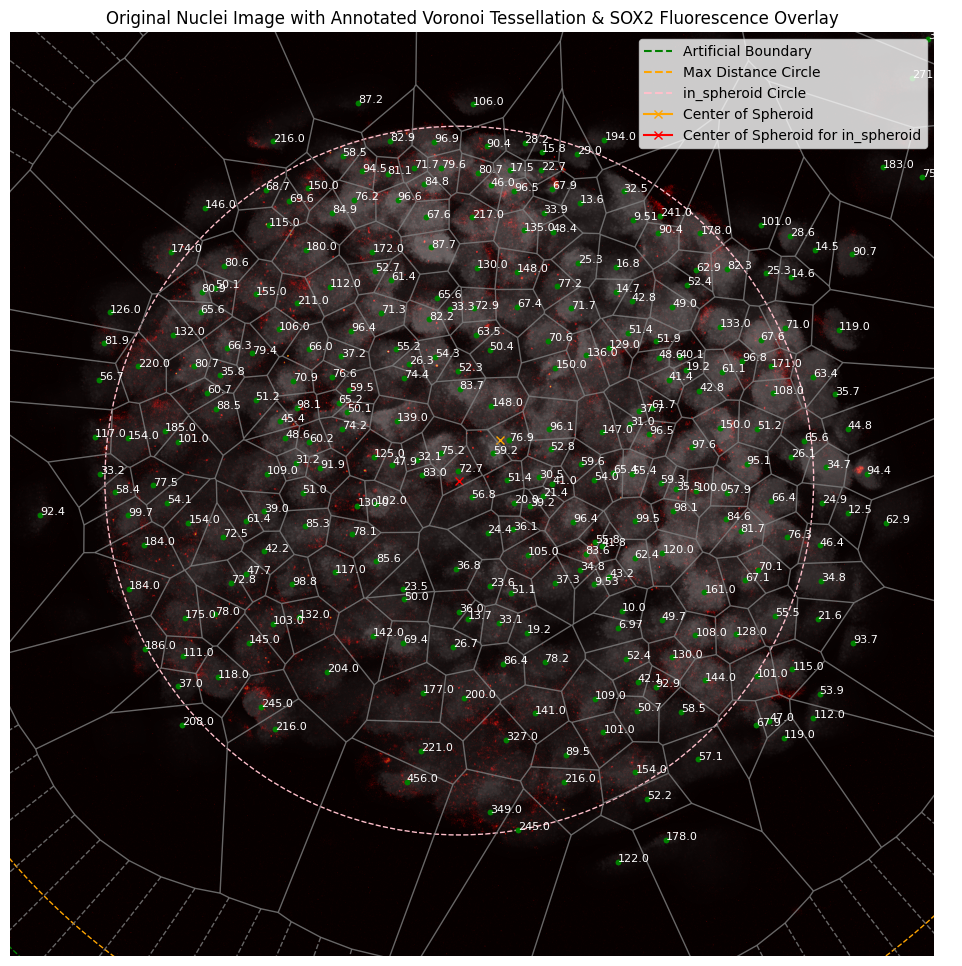

In [24]:
# --------- Regions, Nuclei and SOX2 Overlay ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(12, 12)) # I used a 10x10 figure for the original image, 12x12 is better for the annotated one
ax.imshow(image_opened_bilateral, cmap='gray')


# ---

# Center of spheroid
ax.plot(*center_of_spheroid[::1], color='orange', marker='x')
ax.plot(*center_of_spheroid_aux[::-1], color='red', marker='x')


# Artificial Boundary Circle
circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
ax.add_patch(circle)

# Max distance circle
circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
ax.add_patch(circle)

# in_spheroid Circle
circle = Circle(center_of_spheroid_aux[::-1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
ax.add_patch(circle)

# ---

# Annotate each centroid with its Fluorescence_Intensity, using only the first two significant digits
for idx, (r, c) in enumerate(centroids):
    intensity = df.at[idx, 'Fluorescence_Intensity']
    intensity = float(f'{intensity:.3g}')
    ax.plot(r, c, 'g.')  # Mark the centroid
    ax.text(r, c, str(intensity), color='white', fontsize=8)  # Annotate with intensity

# ---


# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.8)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


# Let's include the legend for the circles and the centers
legend_labels = [Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
                 Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
                 Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle'),
                 Line2D([0], [0], color='orange', marker='x', label='Center of Spheroid'),
                 Line2D([0], [0], color='red', marker='x', label='Center of Spheroid for in_spheroid')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Annotated Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

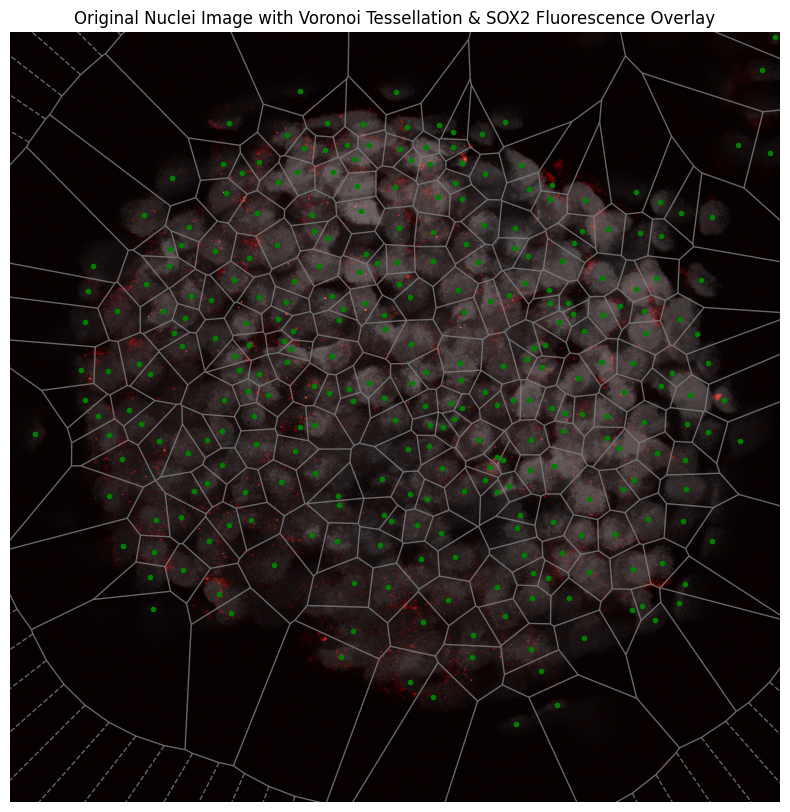

In [25]:
# --------- Regions, Nuclei and SOX2 Overlay ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10)) # I used a 10x10 figure for the original image, 12x12 is better for the annotated one
ax.imshow(image_opened_bilateral, cmap='gray')

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# # Annotate each centroid with its Fluorescence_Intensity, using only the first two significant digits
# for idx, (r, c) in enumerate(centroids):
#     intensity = df.at[idx, 'Fluorescence_Intensity']
#     intensity = float(f'{intensity:.3g}')
#     ax.plot(r, c, 'g.')  # Mark the centroid
#     ax.text(r, c, str(intensity), color='white', fontsize=8)  # Annotate with intensity

# ---


# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.8)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


# # Let's include the legend for the circles
# legend_labels = [Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

# ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

## Stem and Differentiated Cell Clustering

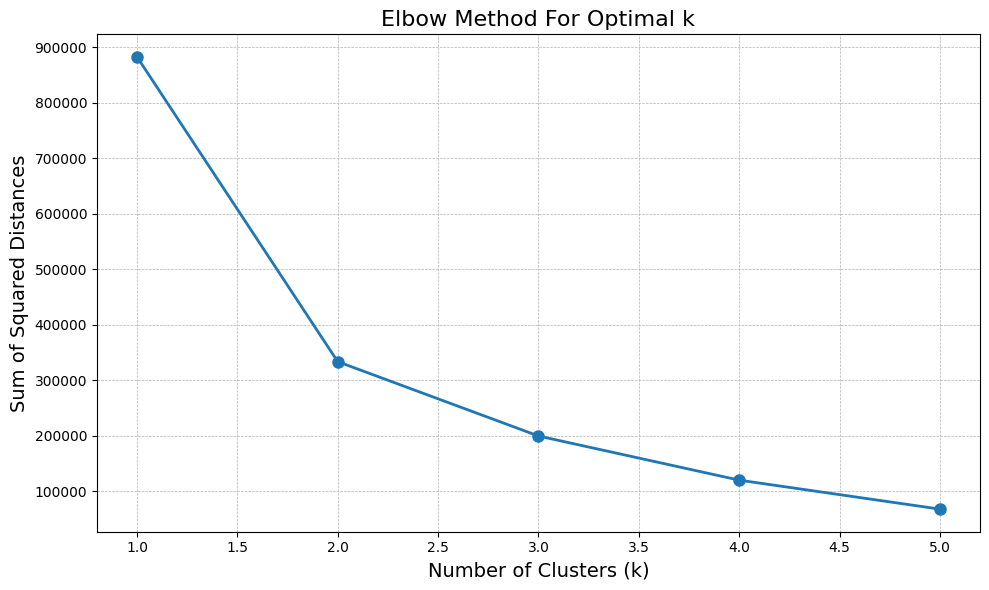

In [26]:
# --------- Elbow plot for cluster number ---------

# Extract fluorescence intensity values from the DataFrame
fluorescence_intensities = df['Fluorescence_Intensity'].loc[df["in_spheroid"]==True].values.reshape(-1, 1)

# Calculate sum of squared distances (SSD) for different values of k
ssd = []
range_n_clusters = range(1, 6)

for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init='auto', random_state=42)
    kmeans.fit(fluorescence_intensities)
    ssd.append(kmeans.inertia_)

# Plot the SSD values against k to visualize the elbow
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ssd, 'o-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Sum of Squared Distances', fontsize=14)
plt.title('Elbow Method For Optimal k', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [27]:
# ======== Original Way ========

# Filter out regions with Fluorescence_Intensity <= 180
filtered_df = df[df['Fluorescence_Intensity'] <= 180].copy()  # Use copy() to ensure we're working on a copy

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)

# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels


# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df['filtered_GMM_stemness'])

# Set the values to 1 where Fluorescence_Intensity > 180
df.loc[df['Fluorescence_Intensity'] > 180, 'filtered_GMM_stemness'] = 1


In [28]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID (still with <180 fliter) ==========

# Filter out regions with Fluorescence_Intensity <= 180 and in_spheroid = True
filtered_df = df[(df['Fluorescence_Intensity'] <= 180) & (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_in_spheroid_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_in_spheroid_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['filtered_in_spheroid_GMM_stemness']])

# Set the values to 1 where Fluorescence_Intensity > 180 and in_spheroid = True
df.loc[(df['Fluorescence_Intensity'] > 180) & (df['in_spheroid']), 'filtered_in_spheroid_GMM_stemness'] = 1


In [29]:
# ========== CUTTING DISTRIBUTION TAILS ==========

# Calculate the 5th and 95th percentile values of Fluorescence_Intensity
lower_threshold = df['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_GMM_stemness' column with NaN
df['tails_cut_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions (non-stem)
df.loc[df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions (stem)
df.loc[df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & (df['Fluorescence_Intensity'] < upper_threshold)].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_GMM_stemness'] = labels

# Update the original dataframe with the GMM clustering results
df.update(filtered_df['tails_cut_GMM_stemness'])



In [30]:
df['tails_cut_GMM_stemness'].value_counts()

tails_cut_GMM_stemness
0.0    229
1.0     72
Name: count, dtype: int64

In [31]:
df['tails_cut_GMM_stemness'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 301 entries, 0 to 300
Series name: tails_cut_GMM_stemness
Non-Null Count  Dtype  
--------------  -----  
301 non-null    float64
dtypes: float64(1)
memory usage: 2.5 KB


In [32]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


# Calculate the 5th and 95th percentile values of Fluorescence_Intensity within the spheroid
lower_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_in_spheroid_GMM_stemness' column with NaN (into which we'll map the GMM labels)
df['tails_cut_in_spheroid_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions within the spheroid (non-stem)
df.loc[(df['Fluorescence_Intensity'] <= lower_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions within the spheroid (stem)
df.loc[(df['Fluorescence_Intensity'] >= upper_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering (inside the spheroid and not in the tails)
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & 
                 (df['Fluorescence_Intensity'] < upper_threshold) & 
                 (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_in_spheroid_GMM_stemness'] = labels


# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['tails_cut_in_spheroid_GMM_stemness']])

# Note: Regions outside the spheroid or in the tails are already handled with NaN or the set values (0 and 1)


In [33]:
df[['label', 'Fluorescence_Intensity', 'filtered_GMM_stemness', 'filtered_in_spheroid_GMM_stemness', 'tails_cut_GMM_stemness', 'tails_cut_in_spheroid_GMM_stemness']].loc[df['Fluorescence_Intensity']>85].loc[df['Fluorescence_Intensity']<95].sort_values(by='Fluorescence_Intensity')

,label,Fluorescence_Intensity,filtered_GMM_stemness,filtered_in_spheroid_GMM_stemness,tails_cut_GMM_stemness,tails_cut_in_spheroid_GMM_stemness
174,175,85.282460,0.0,0.0,0.0,0.0
109,110,85.609819,0.0,0.0,0.0,0.0
262,263,86.350515,0.0,0.0,0.0,0.0
202,203,87.164309,0.0,NaN,0.0,NaN
145,146,87.736965,0.0,0.0,0.0,0.0
69,70,88.470329,0.0,0.0,0.0,0.0
31,32,89.478965,0.0,0.0,0.0,0.0
198,199,90.355398,0.0,0.0,0.0,0.0
199,200,90.443984,0.0,0.0,0.0,0.0
160,161,90.706615,0.0,NaN,0.0,NaN


### Summary

In [34]:
# ========== CALCULATING SUMMARY STATISTICS ==========

# ====== General Information ======
czi_file_name = os.path.basename(czi_file_path)
total_cells = df.shape[0]
cells_in_spheroid = df.loc[df['in_spheroid']==True].shape[0]
cells_outside_spheroid = df.loc[df['in_spheroid']==False].shape[0]


# ====== For 'filtered_GMM_stemness' ======
filtered_GMM_stemness_ones = df['filtered_GMM_stemness'].sum()
percentage_filtered_GMM_stemness_ones = filtered_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'filtered_in_spheroid_GMM_stemness' ======
filtered_in_spheroid_GMM_stemness_ones = df['filtered_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_GMM_stemness' ======
tails_cut_GMM_stemness_ones = df['tails_cut_GMM_stemness'].sum()
percentage_tails_cut_GMM_stemness_ones = tails_cut_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_in_spheroid_GMM_stemness' ======
tails_cut_in_spheroid_GMM_stemness_ones = df['tails_cut_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== Calculate thresholds for each feature ======
def calculate_thresholds(df, feature):
    # Sort the DataFrame by Fluorescence_Intensity
    sorted_df = df.sort_values(by='Fluorescence_Intensity')
    # Identify the max intensity for class 0 and min intensity for class 1
    max_intensity_class_0 = sorted_df[sorted_df[feature] == 0]['Fluorescence_Intensity'].max()
    min_intensity_class_1 = sorted_df[sorted_df[feature] == 1]['Fluorescence_Intensity'].min()
    # Calculate the average to define the threshold
    return (max_intensity_class_0 + min_intensity_class_1) / 2.0

# Calculate thresholds
threshold_filtered_GMM = calculate_thresholds(df, 'filtered_GMM_stemness')
threshold_filtered_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'filtered_in_spheroid_GMM_stemness')
threshold_tails_cut = calculate_thresholds(df, 'tails_cut_GMM_stemness')
threshold_tails_cut_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'tails_cut_in_spheroid_GMM_stemness')


# ========== PRINTING THE SUMMARY STATISTICS ==========
print('-------------------- SUMMARY ------------------------')

# General information
print(f"File name: {czi_file_name}")
print(f'Slice: {z_slice}')
print(f"Total number of cells: {total_cells}")
print(f"Number of cells in the spheroid: {cells_in_spheroid}")
print(f"Number of cells outside the spheroid: {cells_outside_spheroid}")
print('--------------------------------------------')

# For 'filtered_GMM_stemness'
print(f"Number of CSCs according to filtered_GMM_stemness: {filtered_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - filtered_GMM_stemness_ones}')
print(f'They represent {percentage_filtered_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_GMM:.4f}.')
print('--------------------------------------------')

# For 'filtered_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to filtered_in_spheroid_GMM_stemness: {filtered_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - filtered_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_in_spheroid:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_GMM_stemness'
print(f"Number of CSCs according to tails_cut_GMM_stemness: {tails_cut_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - tails_cut_GMM_stemness_ones}')
print(f'They represent {percentage_tails_cut_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to tails_cut_in_spheroid_GMM_stemness: {tails_cut_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - tails_cut_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut_in_spheroid:.4f}.')
print('--------------------------------------------')


-------------------- SUMMARY ------------------------
File name: Sph1 Z Stack - CTRL SOX2.czi
Slice: 4
Total number of cells: 301
Number of cells in the spheroid: 252
Number of cells outside the spheroid: 49
--------------------------------------------
Number of CSCs according to filtered_GMM_stemness: 103.0
Corresponding number of DCCs: 198.0
They represent 34.22% of the total number of cells.
The threshold is roughly at a fluorescence intensity of 94.0453.
--------------------------------------------
Number of CSCs according to filtered_in_spheroid_GMM_stemness: 70.0
Corresponding number of DCCs: 182.0
They represent 23.26% of the total number of cells,
and 27.78% of the number of cells in the spheroid.
The threshold is roughly at a fluorescence intensity of 98.4543.
--------------------------------------------
Number of CSCs according to tails_cut_GMM_stemness: 72.0
Corresponding number of DCCs: 229.0
They represent 23.92% of the total number of cells.
The threshold is roughly at a 

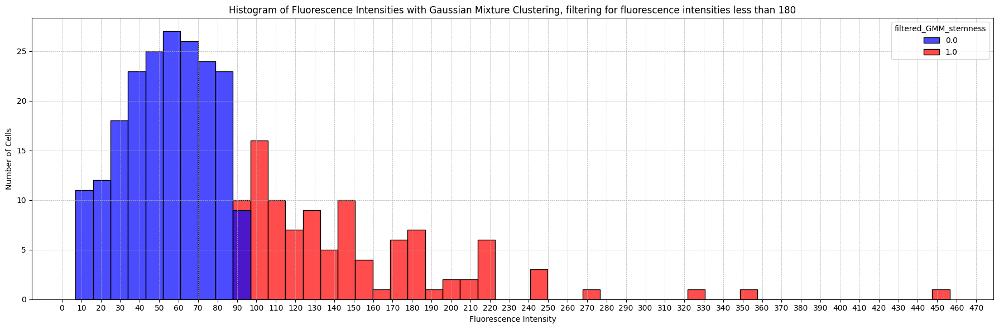

In [35]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='Fluorescence_Intensity', hue='filtered_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

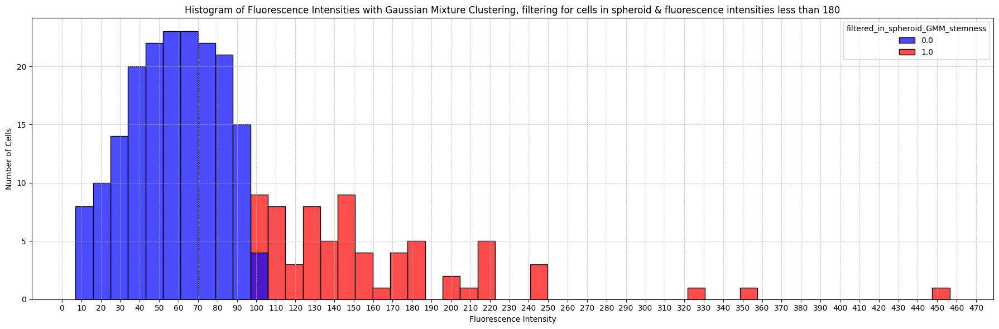

In [36]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='filtered_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

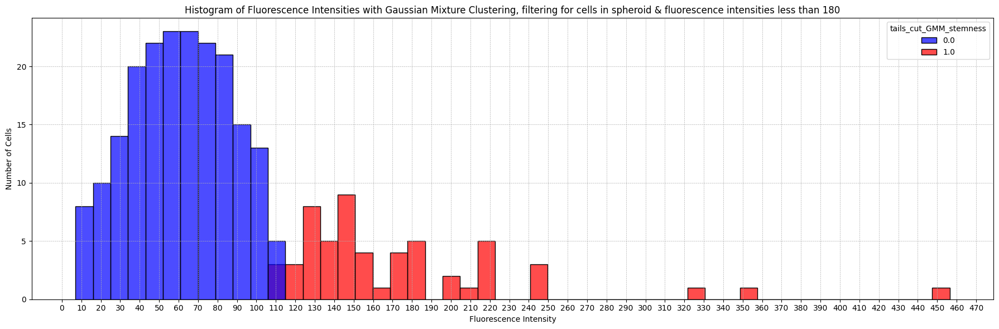

In [37]:
# ========== CUTTING DISTRIBUTION TAILS ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

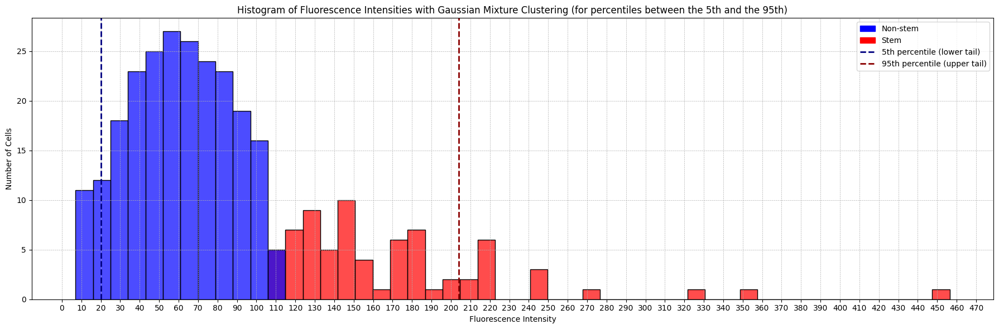

In [38]:
# ========== CUTTING DISTRIBUTION TAILS: TAILS INDICATED ==========

plt.figure(figsize=(18, 6))

# In this case, we do NOT filter for cells in the spheroid, so we use the original df
df_in_spheroid = df

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th)')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()



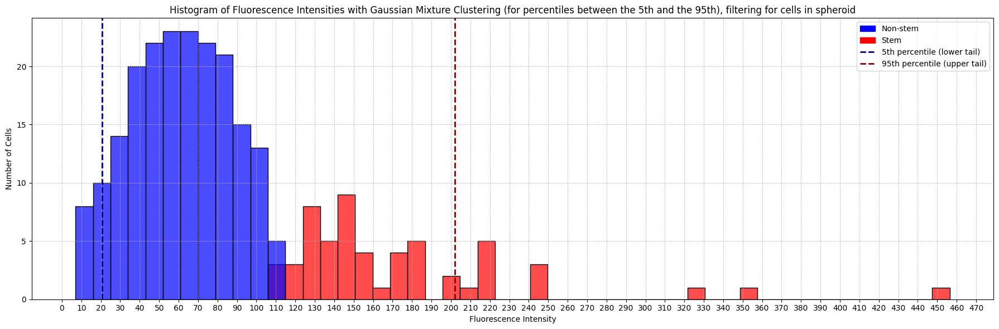

In [39]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


plt.figure(figsize=(18, 6))

# Create a dataframe for cells in the spheroid
df_in_spheroid = df.loc[df['in_spheroid'] == True].copy()

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th), filtering for cells in spheroid')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()


Notar como la línea del percentil 5 se mueve a la derecha. Esto tiene que ver con que excluir células fuera del esferoide, es excluir las sueltas y algunas del borde. Las del borde suelen tener mucha limpieza de SOX2 a su alrededor, por lo que pueden ser altas o bajas según la teselación de ese caso particular. Las que están lejos del esferoide (sueltas), pueden tener mucho SOX2 porque la limpieza no las afecta tanto, pero en general involucran áreas que casi no tienen SOX2 en primer lugar. Como resultado, si bien pueden haber excepciones por los motivos mencionados, excluir células fuera del esferoide puede ya estarme excluyendo fluorescencias bajas (lo que mueve la línea del percentil 5 a la derecha).

In [95]:
# Save the DataFrame to a CSV

# Define the directory path
directory = f"./results/sph1_reprocessed/slice_{z_slice}/"
csv_file_path = os.path.join(directory, f"sph1_slice_{z_slice}_artificial_boundary.csv") # _artificial_boundary

# # Save the DataFrame to a CSV in the specified directory
# df.to_csv(csv_file_path, index=False)


## Plots

### Criterion: `filtered_GMM_stemness`

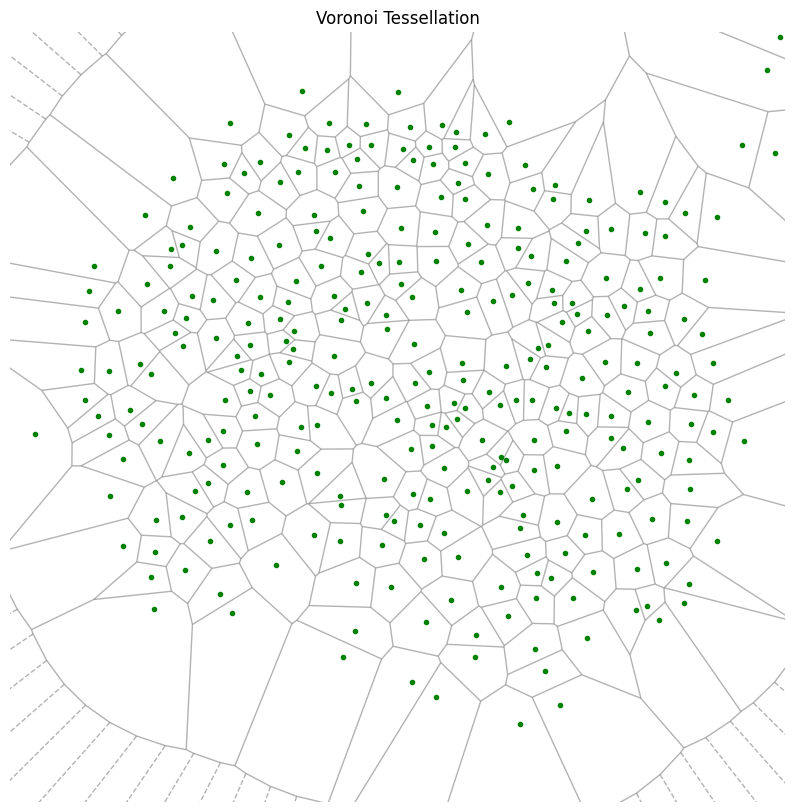

In [40]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# # Display the colored Voronoi overlay
# ax.imshow(voronoi_overlay, alpha=0.8)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

# ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation')
plt.axis('off')

plt.show()

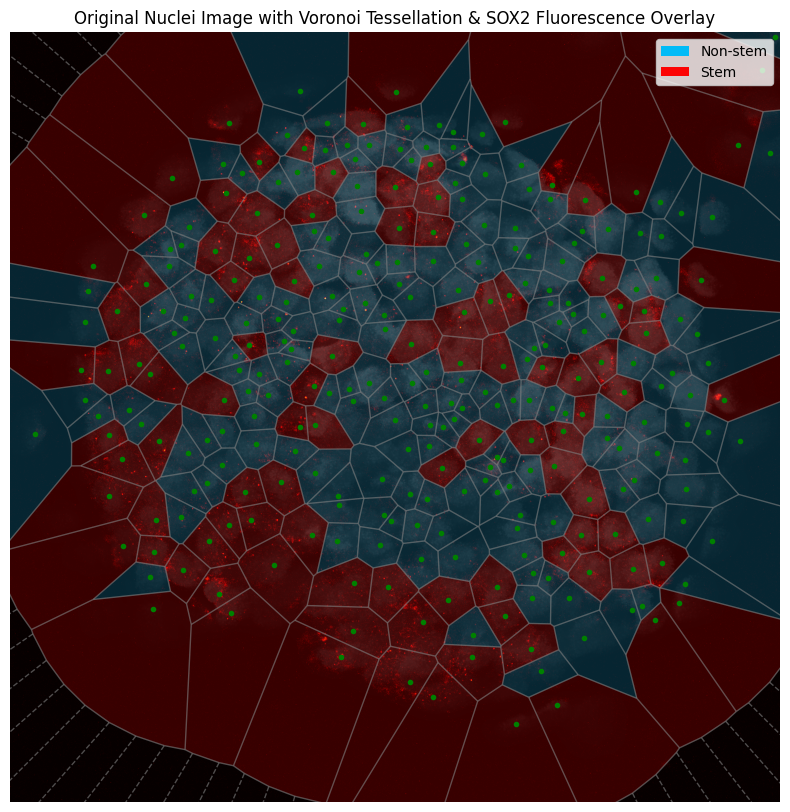

In [41]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

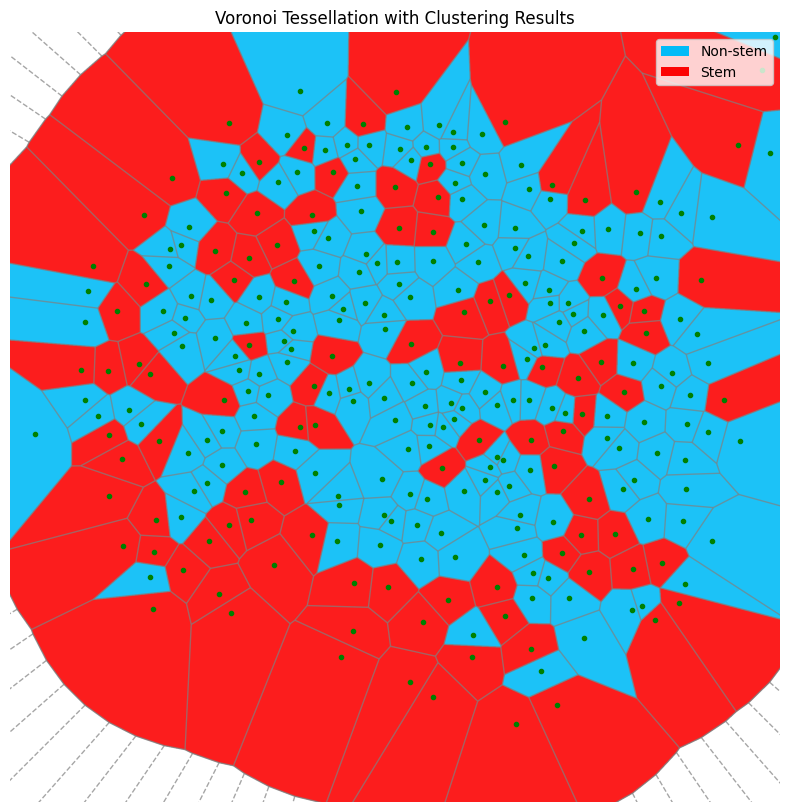

In [42]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `filtered_in_spheroid_GMM_stemness`

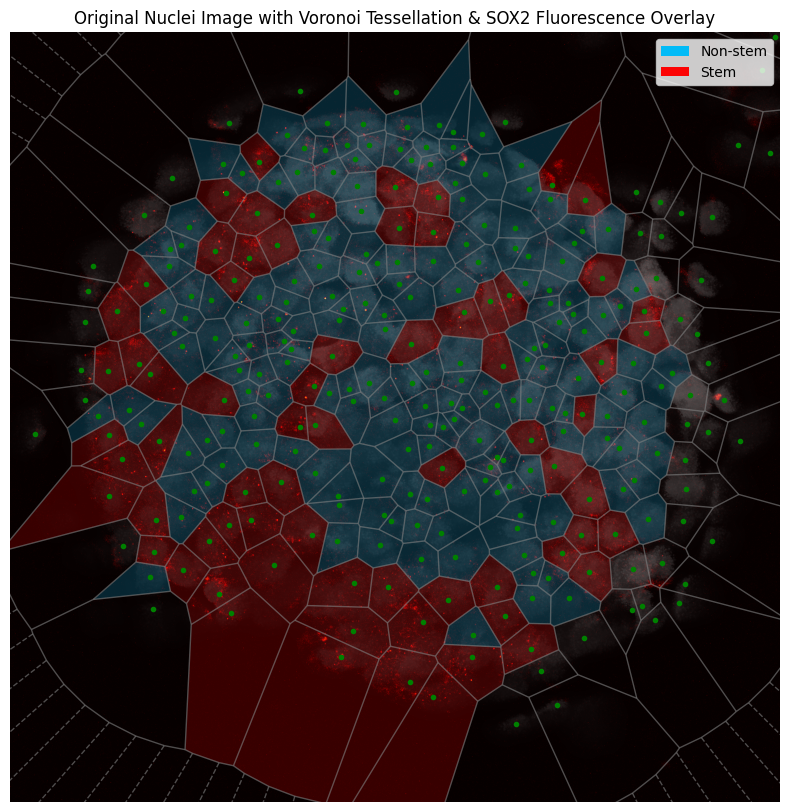

In [43]:
# ========== CRITERION: filtered_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

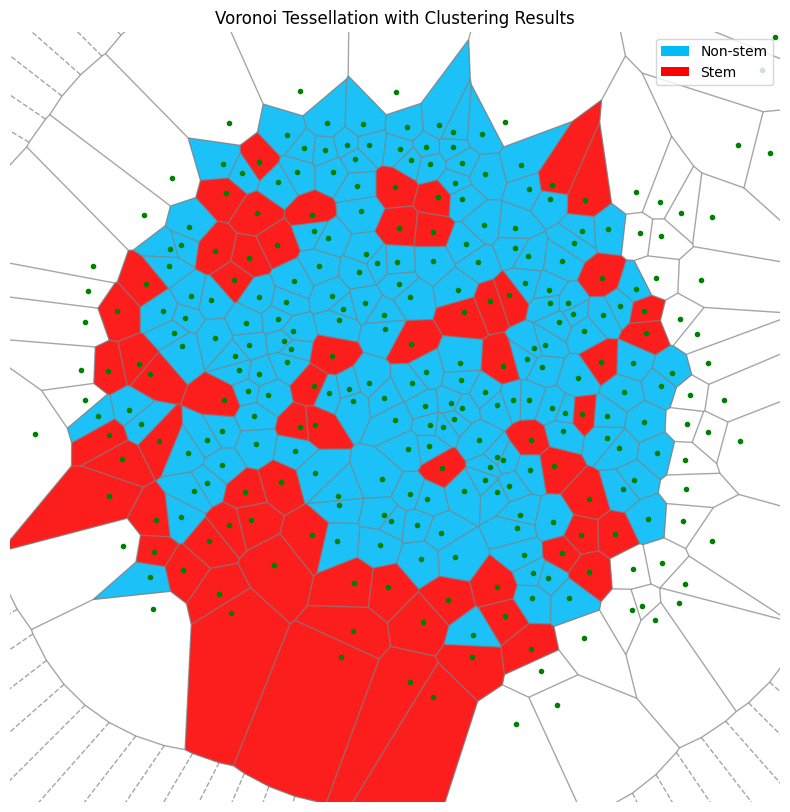

In [44]:
# ========== CRITERION: filtered_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `tails_cut_GMM_stemness`

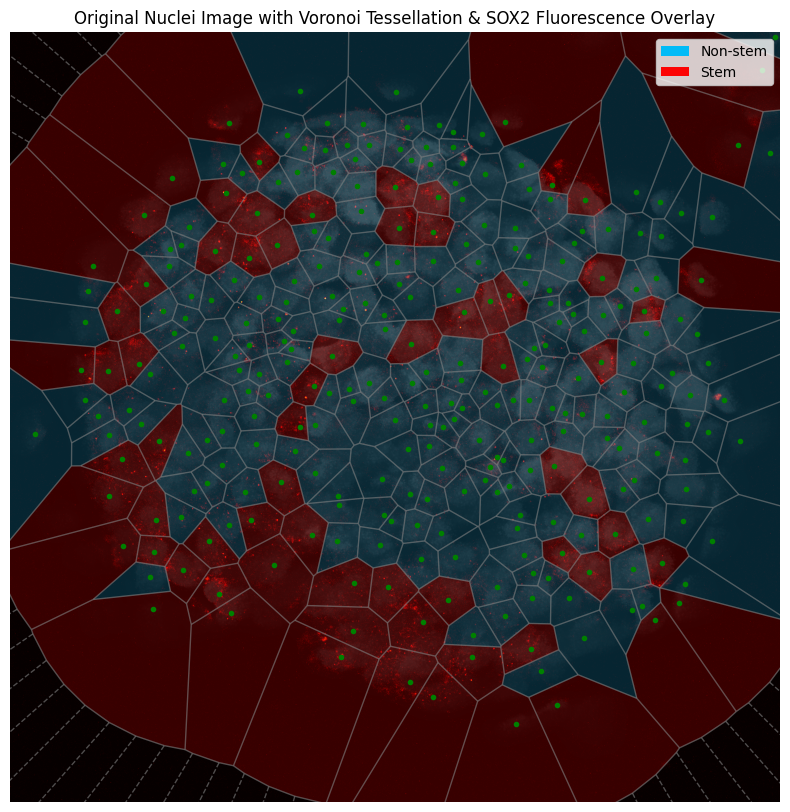

In [45]:
# ========== CRITERION: tails_cut_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

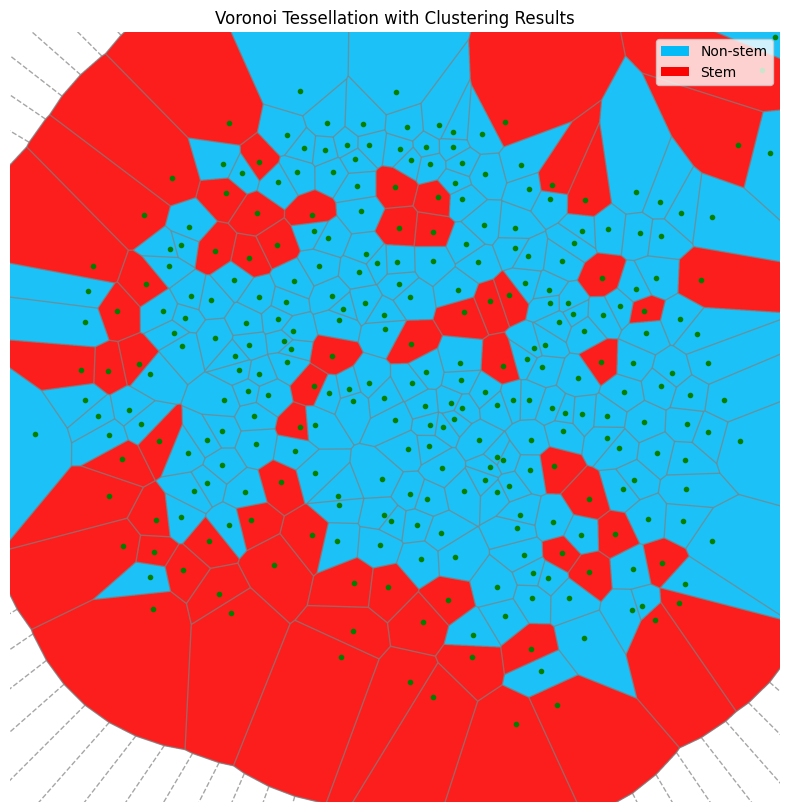

In [46]:
# ========== CRITERION: tails_cut_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `tails_cut_in_spheroid_GMM_stemness`

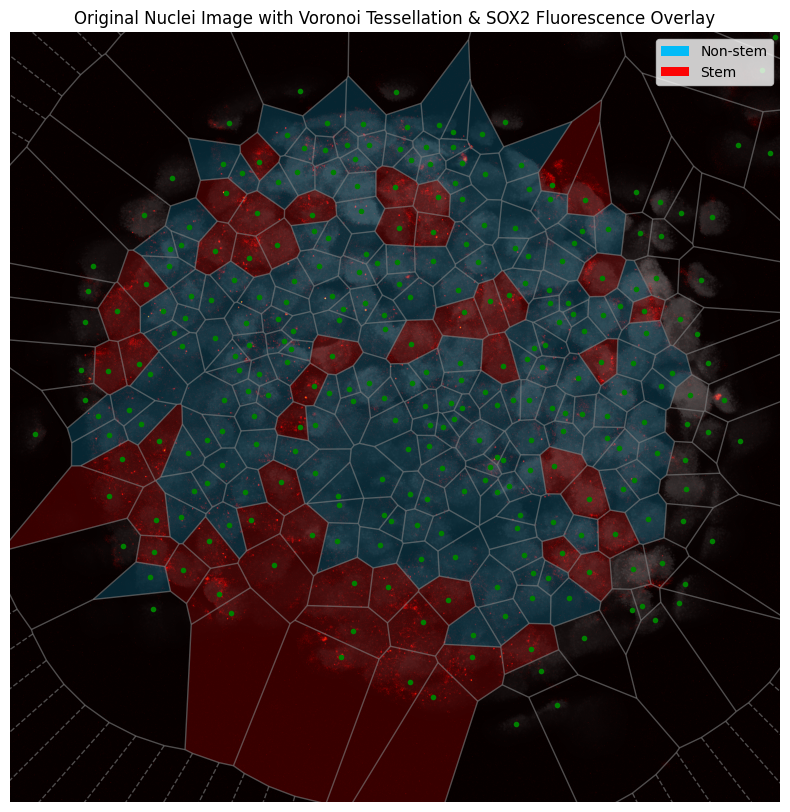

In [47]:
# ========== CRITERION: tails_cut_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

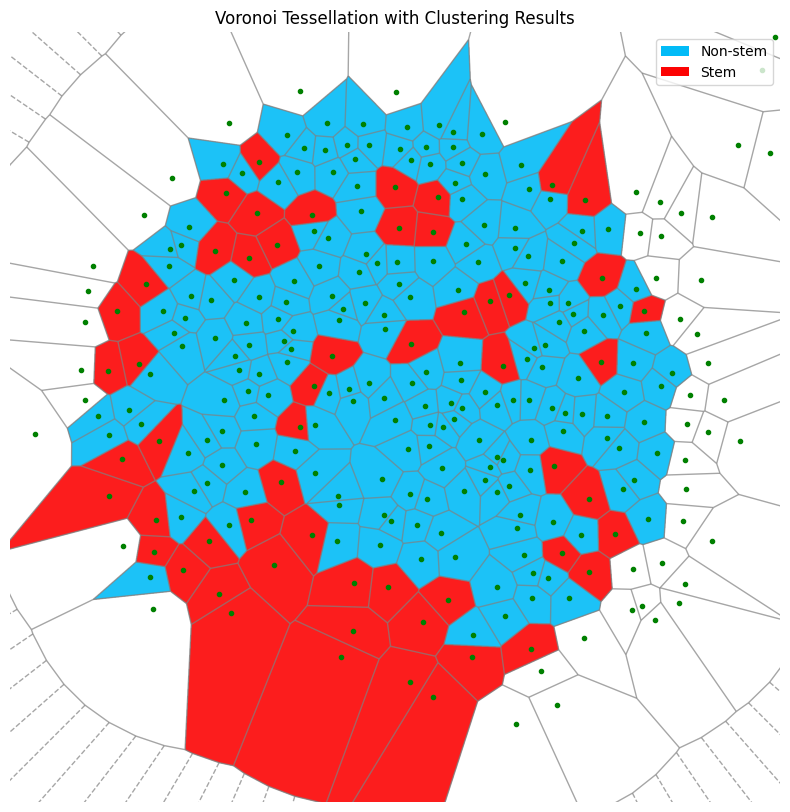

In [48]:
# ========== CRITERION: tails_cut_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

## Random State Statistics
The clustering appears to vary significantly depending on the seed (`random_state`). Let's take a criterion and do the clustering for several different seeds. For this test, I'll use the `tails_cut_GMM_stemness` criterion. I do not use the `tails_cut_in_spheroid_GMM_stemness` criterion because in this case, every cell outside the spheroid gets classified as a non-stem cell.

In [105]:
# Let's check the stemness of the ones outside the spheroid
df.loc[df['in_spheroid'] == False, ['label', 'tails_cut_in_spheroid_GMM_stemness', 'tails_cut_GMM_stemness', 'filtered_in_spheroid_GMM_stemness', 'filtered_GMM_stemness']]

,label,tails_cut_in_spheroid_GMM_stemness,tails_cut_GMM_stemness,filtered_in_spheroid_GMM_stemness,filtered_GMM_stemness
5,6,NaN,0.0,NaN,0.0
6,7,NaN,0.0,NaN,0.0
7,8,NaN,0.0,NaN,0.0
11,12,NaN,0.0,NaN,0.0
14,15,NaN,0.0,NaN,1.0
22,23,NaN,0.0,NaN,0.0
23,24,NaN,1.0,NaN,1.0
29,30,NaN,1.0,NaN,1.0
36,37,NaN,1.0,NaN,1.0
47,48,NaN,0.0,NaN,0.0


In [106]:
# ========== MANY SEEDS FOR GMM CLUSTERING CUTTING DISTRIBUTION TAILS ==========


# Function to calculate thresholds for each feature
def calculate_thresholds(sorted_df, feature):
    max_intensity_class_0 = sorted_df[sorted_df[feature] == 0]['Fluorescence_Intensity'].max()
    min_intensity_class_1 = sorted_df[sorted_df[feature] == 1]['Fluorescence_Intensity'].min()
    return (max_intensity_class_0 + min_intensity_class_1) / 2.0

# Prepare the DataFrame to store the results
results_df = pd.DataFrame(columns=['algorithm', 'random_state', 'num_stem_cells', 'num_non_stem_cells', 'stem_fraction', 'FI_threshold'])

# Generate a large batch of random numbers for seeds
random_states = np.random.randint(0, 1000, size=100)  # 100 different seeds

for random_state in random_states:
    # Start with a fresh copy of the Fluorescence_Intensity data
    current_df = df[['Fluorescence_Intensity', 'in_spheroid']].copy()
    
    # Calculate the 5th and 95th percentile values of Fluorescence_Intensity
    lower_threshold = current_df['Fluorescence_Intensity'].quantile(0.05)
    upper_threshold = current_df['Fluorescence_Intensity'].quantile(0.95)

    # Initialize the 'tails_cut_GMM_stemness' column with NaN
    current_df['tails_cut_GMM_stemness'] = np.nan

    # Assign 0 to the 5% lowest intensity regions (non-stem)
    current_df.loc[current_df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_GMM_stemness'] = 0

    # Assign 1 to the 95% highest intensity regions (stem)
    current_df.loc[current_df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_GMM_stemness'] = 1

    # Filter the dataframe for the regions to be included in GMM clustering
    filtered_df = current_df[(current_df['Fluorescence_Intensity'] > lower_threshold) & (current_df['Fluorescence_Intensity'] < upper_threshold)].copy()

    # Reshape the Fluorescence_Intensity data for clustering
    X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

    # Perform GMM clustering with the current random state
    gmm = GaussianMixture(n_components=2, random_state=random_state)
    gmm.fit(X)
    labels = gmm.predict(X)

    # Compute the mean fluorescence intensity for each cluster
    cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

    # Identify the labels of the clusters with higher and lower mean intensities
    label_higher_intensity = cluster_means.argmax()
    label_lower_intensity = cluster_means.argmin()

    # Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
    labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
    labels[labels == label_lower_intensity] = 0
    labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

    # Assign the corrected labels to the filtered dataframe
    filtered_df.loc[:, 'tails_cut_GMM_stemness'] = labels

    # Update the original dataframe with the GMM clustering results
    current_df.update(filtered_df['tails_cut_GMM_stemness'])

    # Calculate summary statistics
    num_stem_cells = current_df['tails_cut_GMM_stemness'].sum()
    num_non_stem_cells = current_df['tails_cut_GMM_stemness'].count() - num_stem_cells
    stem_fraction = num_stem_cells / current_df['tails_cut_GMM_stemness'].count() * 100
    FI_threshold = calculate_thresholds(current_df, 'tails_cut_GMM_stemness')

    # Store the results
    temp_df = pd.DataFrame({'algorithm': ['GMM'],
                            'random_state': [random_state],
                            'num_stem_cells': [num_stem_cells],
                            'num_non_stem_cells': [num_non_stem_cells],
                            'stem_fraction': [stem_fraction],
                            'FI_threshold': [FI_threshold]})
    results_df = pd.concat([results_df, temp_df], ignore_index=True)

# Display or save the results
results_df
# results_df.to_csv('gmm_clustering_variability.csv', index=False)



3500701756.py (75): The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.


,algorithm,random_state,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
0,GMM,798,89.0,212.0,29.568106,98.454265
1,GMM,456,72.0,229.0,23.920266,109.996300
2,GMM,310,72.0,229.0,23.920266,109.996300
3,GMM,791,89.0,212.0,29.568106,98.454265
4,GMM,877,89.0,212.0,29.568106,98.454265
...,...,...,...,...,...,...
95,GMM,677,77.0,224.0,25.581395,106.103326
96,GMM,772,89.0,212.0,29.568106,98.454265
97,GMM,703,79.0,222.0,26.245847,103.975196
98,GMM,58,79.0,222.0,26.245847,103.975196


In [107]:
results_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,100.000000,100.000000,100.000000,100.000000
mean,82.760000,218.240000,27.495017,102.616028
std,7.848464,7.848464,2.607463,5.293771
min,72.000000,212.000000,23.920266,98.454265
25%,72.000000,212.000000,23.920266,98.454265
50%,89.000000,212.000000,29.568106,98.454265
75%,89.000000,229.000000,29.568106,109.996300
max,89.000000,229.000000,29.568106,109.996300


In [108]:
results_df['FI_threshold'].value_counts()

FI_threshold
98.454265     60
109.996300    30
106.103326     4
103.975196     4
105.434218     1
108.709648     1
Name: count, dtype: int64

En general, se concentran en los dos mismo valores (71 y 75), y pocas veces se queda al medio. Creo que esto tiene que ver con si la gaussiana mayor se inicializa a la izquierda o a la derecha.

---

Tendríamos que probar qué pasa con otros criterios y tratar de incluirlos en la estadística. Podríamos cambiar los percentiles que cortamos en las colas o el algoritmo (además de los otros 3 criterios que usamos antes).

In [109]:
# ========== MANY SEEDS FOR K-MEANS CLUSTERING CUTTING DISTRIBUTION TAILS ==========

# Generate a large batch of random numbers for seeds
random_states = np.random.randint(0, 1000, size=100)  # 100 different seeds

for random_state in random_states:
    # Start with a fresh copy of the Fluorescence_Intensity data
    current_df = df[['Fluorescence_Intensity', 'in_spheroid']].copy()
    
    # Calculate the 5th and 95th percentile values of Fluorescence_Intensity
    lower_threshold = current_df['Fluorescence_Intensity'].quantile(0.05)
    upper_threshold = current_df['Fluorescence_Intensity'].quantile(0.95)

    # Initialize the 'tails_cut_kmeans_stemness' column with NaN
    current_df['tails_cut_kmeans_stemness'] = np.nan

    # Assign 0 to the 5% lowest intensity regions (non-stem)
    current_df.loc[current_df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_kmeans_stemness'] = 0

    # Assign 1 to the 95% highest intensity regions (stem)
    current_df.loc[current_df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_kmeans_stemness'] = 1

    # Filter the dataframe for the regions to be included in clustering
    filtered_df = current_df[(current_df['Fluorescence_Intensity'] > lower_threshold) & (current_df['Fluorescence_Intensity'] < upper_threshold)].copy()

    # Reshape the Fluorescence_Intensity data for clustering
    X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

    # Perform k-means clustering with the current random state
    kmeans = KMeans(n_clusters=2, n_init=20 , random_state=random_state)
    kmeans.fit(X)
    labels = kmeans.predict(X)

    # Compute the mean fluorescence intensity for each cluster
    cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

    # Identify the labels of the clusters with higher and lower mean intensities
    label_higher_intensity = cluster_means.argmax()
    label_lower_intensity = cluster_means.argmin()

    # Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
    labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
    labels[labels == label_lower_intensity] = 0
    labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

    # Assign the corrected labels to the filtered dataframe
    filtered_df.loc[:, 'tails_cut_kmeans_stemness'] = labels

    # Update the original dataframe with the clustering results
    current_df.update(filtered_df['tails_cut_kmeans_stemness'])

    # Calculate summary statistics
    num_stem_cells = current_df['tails_cut_kmeans_stemness'].sum()
    num_non_stem_cells = current_df['tails_cut_kmeans_stemness'].count() - num_stem_cells
    stem_fraction = num_stem_cells / current_df['tails_cut_kmeans_stemness'].count() * 100
    FI_threshold = calculate_thresholds(current_df, 'tails_cut_kmeans_stemness')

    # Store the results
    temp_df = pd.DataFrame({'algorithm': ['k-means'],
                            'random_state': [random_state],
                            'num_stem_cells': [num_stem_cells],
                            'num_non_stem_cells': [num_non_stem_cells],
                            'stem_fraction': [stem_fraction],
                            'FI_threshold': [FI_threshold]})
    results_df = pd.concat([results_df, temp_df], ignore_index=True)
    
# Display or save the results
results_df
# results_df.to_csv('clustering_variability.csv', index=False)


,algorithm,random_state,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
0,GMM,798,89.0,212.0,29.568106,98.454265
1,GMM,456,72.0,229.0,23.920266,109.996300
2,GMM,310,72.0,229.0,23.920266,109.996300
3,GMM,791,89.0,212.0,29.568106,98.454265
4,GMM,877,89.0,212.0,29.568106,98.454265
...,...,...,...,...,...,...
195,k-means,57,103.0,198.0,34.219269,94.045323
196,k-means,754,103.0,198.0,34.219269,94.045323
197,k-means,16,103.0,198.0,34.219269,94.045323
198,k-means,231,103.0,198.0,34.219269,94.045323


In [110]:
results_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,200.000000,200.000000,200.000000,200.000000
mean,92.880000,208.120000,30.857143,98.330676
std,11.557399,11.557399,3.839667,5.691935
min,72.000000,198.000000,23.920266,94.045323
25%,89.000000,198.000000,29.568106,94.045323
50%,96.000000,205.000000,31.893688,96.249794
75%,103.000000,212.000000,34.219269,98.454265
max,103.000000,229.000000,34.219269,109.996300


In [111]:
results_df['FI_threshold'].value_counts()

FI_threshold
94.045323     100
98.454265      60
109.996300     30
106.103326      4
103.975196      4
105.434218      1
108.709648      1
Name: count, dtype: int64

In [112]:
# Let's filtere by k-means
kmeans_df = results_df[results_df['algorithm'] == 'k-means']
kmeans_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,100.0,100.0,100.000000,1.000000e+02
mean,103.0,198.0,34.219269,9.404532e+01
std,0.0,0.0,0.000000,2.856489e-14
min,103.0,198.0,34.219269,9.404532e+01
25%,103.0,198.0,34.219269,9.404532e+01
50%,103.0,198.0,34.219269,9.404532e+01
75%,103.0,198.0,34.219269,9.404532e+01
max,103.0,198.0,34.219269,9.404532e+01


In [113]:
kmeans_df['FI_threshold'].value_counts()

FI_threshold
94.045323    100
Name: count, dtype: int64

K-means da un umbral un poco más bajo, pero bastante parecido (sólo suma 7 células madre aproximadamente).

In [114]:
# Save the DataFrame to a CSV

# Define the directory path
directory = f"./results/sph1_reprocessed/slice_{z_slice}/"
csv_file_path = os.path.join(directory, f"clustering_analysis_sph1_slice_{z_slice}.csv")

# # Save the DataFrame to a CSV in the specified directory
# df.to_csv(csv_file_path, index=False)

## Additional Results

### Histogramas de diámetros: stem vs non-stem
El histograma completo está hecho antes, estos discriminan entre madres y no madres con los criterios `tails_cut_GMM_stemness` y `tails_cut_in_spheroid_GMM_stemness`.

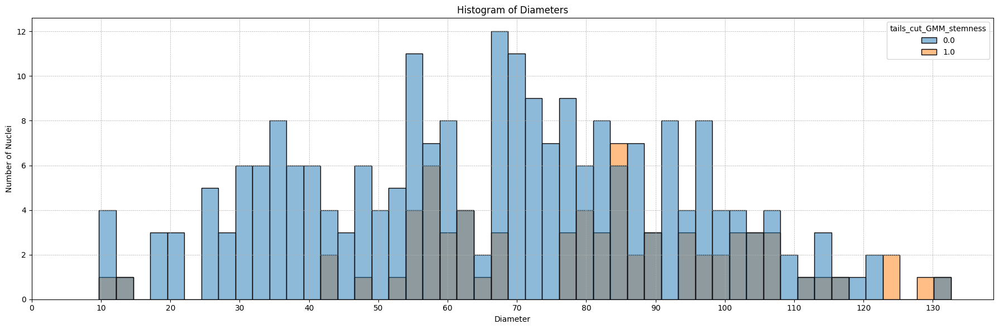

In [52]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='equivalent_diameter', hue='tails_cut_GMM_stemness', bins=50, element='bars', stat='count', alpha=0.5)

# Plot customization to resemble the original plot
plt.title('Histogram of Diameters')
plt.xlabel('Diameter')
plt.ylabel('Number of Nuclei')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

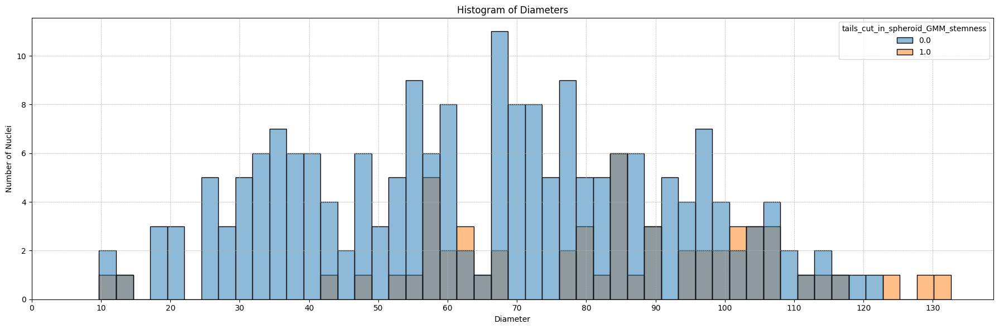

In [53]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='equivalent_diameter', hue='tails_cut_in_spheroid_GMM_stemness', bins=50, element='bars', stat='count', alpha=0.5)

# Plot customization to resemble the original plot
plt.title('Histogram of Diameters')
plt.xlabel('Diameter')
plt.ylabel('Number of Nuclei')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

### Distribución Radial de Diámetros
Primero hacemos un scatterplot con todos los puntos, coloreando por stemness (usé `tails_cut_GMM_stemness`, pero se puede cambiar el criterio fácilmente). Luego hice una regresión lineal de todas juntas, y discriminando por stemness, para ver si había una tendencia (incluyendo una versión con `statsmodels` que tiene un reporte más detallado). Obtuve también la matriz de covarianza; la componente no diagonal positiva era esperable ya que el ajuste tiene pendiente positiva.


In [54]:
df[['distance_to_center', 'equivalent_diameter', 'tails_cut_GMM_stemness', 'tails_cut_in_spheroid_GMM_stemness']]

,distance_to_center,equivalent_diameter,tails_cut_GMM_stemness,tails_cut_in_spheroid_GMM_stemness
0,784.546202,61.057722,0.0,0.0
1,389.762767,72.225082,0.0,0.0
2,474.996887,78.037842,0.0,0.0
3,684.143142,83.461929,1.0,1.0
4,779.691824,73.257796,0.0,0.0
...,...,...,...,...
296,303.510725,56.632945,0.0,0.0
297,877.870386,88.827166,1.0,1.0
298,956.080736,12.153016,0.0,NaN
299,93.375528,35.860451,0.0,0.0


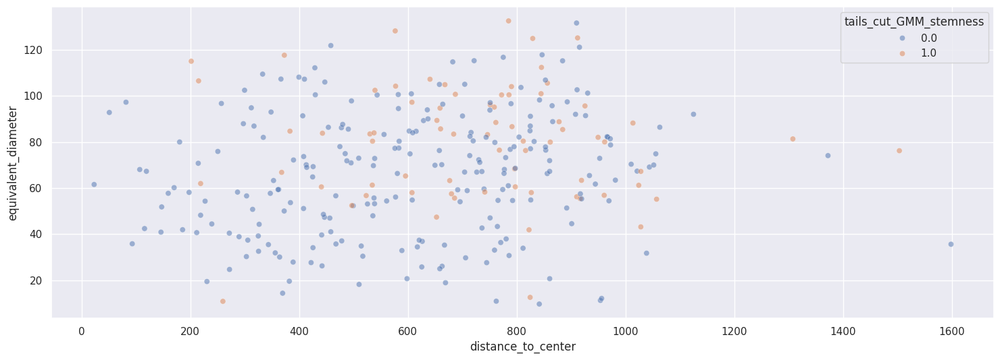

In [89]:
# Let's do a scatter plot of distance to center vs equivalent diameter, colored by stemness
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, x='distance_to_center', y='equivalent_diameter', hue='tails_cut_GMM_stemness', alpha=0.5)
plt.show()

In [101]:
# Let's obtain the covariance matrix of equivalent diameter and distance to center
df[['equivalent_diameter', 'distance_to_center']].cov()

,equivalent_diameter,distance_to_center
equivalent_diameter,708.537986,1013.211954
distance_to_center,1013.211954,67310.308287


All cells, fit coefficients: 
	Slope: 0.0151 
	Intercept: 59.9356



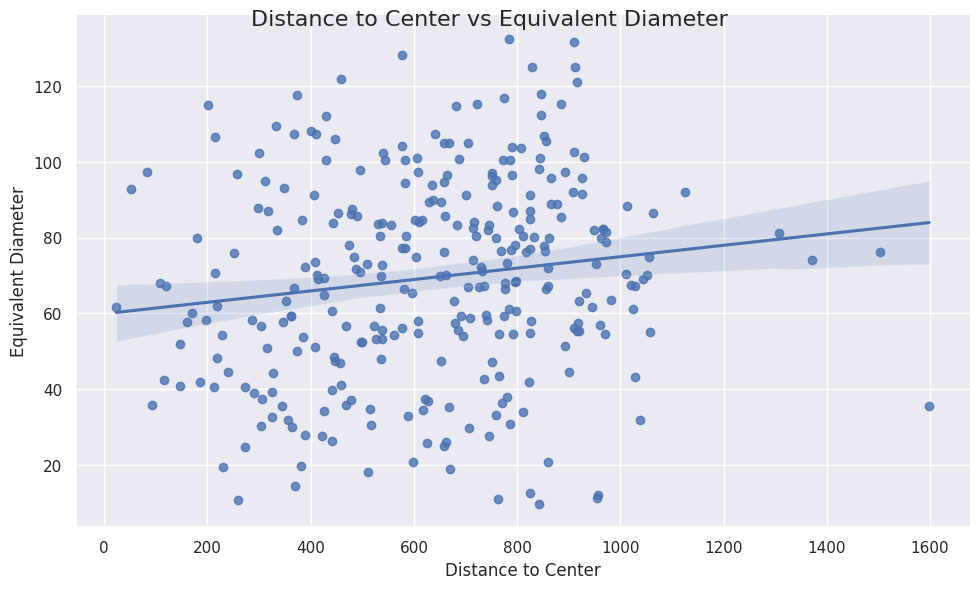

In [98]:
# Set the style
sns.set(style="darkgrid")

# Create the lmplot
g = sns.lmplot(
    x="distance_to_center",
    y="equivalent_diameter",
    # hue="tails_cut_GMM_stemness",
    data=df,
    # markers=["o", "x"], 
    fit_reg=True,
    height=6,  
    aspect=1.66
)

# Function to print the slope and intercept
def print_fit_parameters(coefficients, label):
    slope, intercept = coefficients
    print(f"{label}, fit coefficients: \n\tSlope: {slope:.4f} \n\tIntercept: {intercept:.4f}\n")

# Calculate and print regression parameters for all cells
coefficients = np.polyfit(df['distance_to_center'], df['equivalent_diameter'], 1)
print_fit_parameters(coefficients, "All cells")

# Improve the legend and axis labels
g.set_axis_labels('Distance to Center', 'Equivalent Diameter')
g.fig.suptitle('Distance to Center vs Equivalent Diameter', fontsize=16)

# Show the plot
plt.show()



Non-stem cells, fit coefficients: 
	Slope: 0.0148 
	Intercept: 57.1224

Stem cells, fit coefficients: 
	Slope: -0.0057 
	Intercept: 84.3946



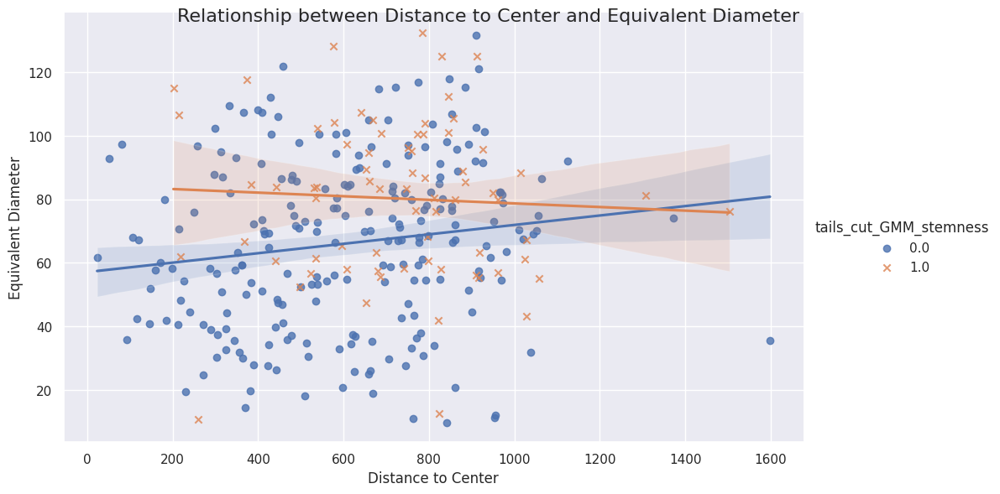

In [99]:
# Set the style
sns.set(style="darkgrid")

# Create the lmplot
g = sns.lmplot(
    x="distance_to_center",
    y="equivalent_diameter",
    hue="tails_cut_GMM_stemness",
    data=df, markers=["o", "x"], 
    fit_reg=True,
    height=6,  
    aspect=1.66
)

# Function to print the slope and intercept
def print_fit_parameters(coefficients, label):
    slope, intercept = coefficients
    print(f"{label}, fit coefficients: \n\tSlope: {slope:.4f} \n\tIntercept: {intercept:.4f}\n")

# Calculate and print regression parameters for non-stem cells
non_stem = df[df['tails_cut_GMM_stemness'] == 0]
coefficients_ns = np.polyfit(non_stem['distance_to_center'], non_stem['equivalent_diameter'], 1)
print_fit_parameters(coefficients_ns, "Non-stem cells")

# Calculate and print regression parameters for stem cells
stem = df[df['tails_cut_GMM_stemness'] == 1]
coefficients_s = np.polyfit(stem['distance_to_center'], stem['equivalent_diameter'], 1)
print_fit_parameters(coefficients_s, "Stem cells")

# Improve the legend and axis labels
g.set_axis_labels('Distance to Center', 'Equivalent Diameter')
g.fig.suptitle('Relationship between Distance to Center and Equivalent Diameter', fontsize=16)

# Show the plot
plt.show()


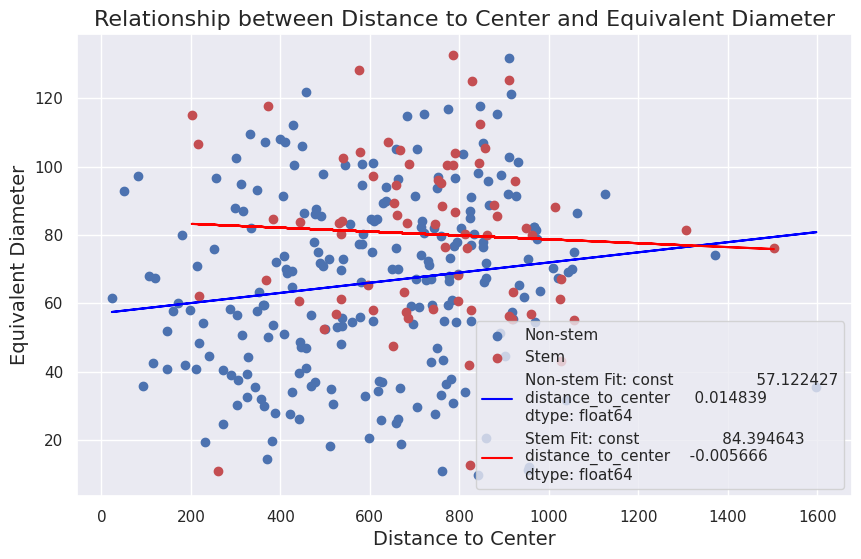

                             OLS Regression Results                            
Dep. Variable:     equivalent_diameter   R-squared:                       0.021
Model:                             OLS   Adj. R-squared:                  0.017
Method:                  Least Squares   F-statistic:                     4.980
Date:                 Wed, 27 Dec 2023   Prob (F-statistic):             0.0266
Time:                         13:45:27   Log-Likelihood:                -1071.2
No. Observations:                  229   AIC:                             2146.
Df Residuals:                      227   BIC:                             2153.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 57.1

In [86]:
# ====== MORE DETAILED STATISTICS ======

# Set the style
sns.set(style="darkgrid")

# Create the figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Scatter plot
non_stem = df[df['tails_cut_GMM_stemness'] == 0]
stem = df[df['tails_cut_GMM_stemness'] == 1]
ax.scatter(non_stem['distance_to_center'], non_stem['equivalent_diameter'], label='Non-stem', color='b')
ax.scatter(stem['distance_to_center'], stem['equivalent_diameter'], label='Stem', color='r')

# Fit and plot regression line for Non-stem
X_ns = sm.add_constant(non_stem['distance_to_center'])  # adding a constant
model_ns = sm.OLS(non_stem['equivalent_diameter'], X_ns).fit()
predictions_ns = model_ns.predict(X_ns)
ax.plot(non_stem['distance_to_center'], predictions_ns, color='blue', label=f'Non-stem Fit: {model_ns.params}')

# Fit and plot regression line for Stem
X_s = sm.add_constant(stem['distance_to_center'])  # adding a constant
model_s = sm.OLS(stem['equivalent_diameter'], X_s).fit()
predictions_s = model_s.predict(X_s)
ax.plot(stem['distance_to_center'], predictions_s, color='red', label=f'Stem Fit: {model_s.params}')

# Customize the axes and title
ax.set_title('Relationship between Distance to Center and Equivalent Diameter', fontsize=16)
ax.set_xlabel('Distance to Center', fontsize=14)
ax.set_ylabel('Equivalent Diameter', fontsize=14)

# Legend
ax.legend()

# Show the plot
plt.show()

# Print the summary of the regression models
print(model_ns.summary())
print(model_s.summary())


### Diámetro del esferoide completo
De los gráficos de las distribuciones se ve que el radio del esferoide $r$ es aprox. $r \simeq 125 \mu \text{m}$. Una cota para el radio es $r<180 \mu \text{m}$.

In [122]:
# Extract the spacing values
spacing_y, spacing_x = 1.2364633517553391e-7, 1.2364633517553391e-7  # meters per pixel in y and x dimensions

# Calculate the new centroid coordinates
df['centroid-0_meters'] = df['centroid-0'].astype('float64') * spacing_y
df['centroid-1_meters'] = df['centroid-1'].astype('float64') * spacing_x

# Calculate the center of the spheroid in meters
center_of_spheroid_meters = np.mean(df[['centroid-0_meters', 'centroid-1_meters']], axis=0)

# Calculate the distance of each object to the center of the spheroid
df['distance_to_center_meters'] = np.sqrt((df['centroid-0_meters'] - center_of_spheroid_meters[0])**2 +
                                          (df['centroid-1_meters'] - center_of_spheroid_meters[1])**2)

# Convert distance from meters to micrometers (1 meter = 1,000,000 micrometers)
df['distance_to_center_micrometers'] = df['distance_to_center_meters'] * 1e6

# Set display options for floating-point numbers
pd.set_option('display.float_format', '{:.2e}'.format)  # decimal places in scientific notation
# pd.reset_option('display.float_format') # to go back to default

# Now df includes the centroids in meters
df[['centroid-0', 'centroid-1', 'centroid-0_meters', 'centroid-1_meters', 'distance_to_center_meters', 'distance_to_center_micrometers']]


237818522.py (12): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
237818522.py (13): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


,centroid-0,centroid-1,centroid-0_meters,centroid-1_meters,distance_to_center_meters,distance_to_center_micrometers
0,3.36e+02,1.00e+03,4.16e-05,1.24e-04,8.76e-05,8.76e+01
1,1.14e+03,7.26e+02,1.41e-04,8.98e-05,6.25e-05,6.25e+01
2,1.30e+03,1.55e+03,1.61e-04,1.92e-04,5.49e-05,5.49e+01
3,6.50e+02,6.10e+02,8.04e-05,7.54e-05,8.71e-05,8.71e+01
4,3.43e+02,1.24e+03,4.24e-05,1.53e-04,8.29e-05,8.29e+01
...,...,...,...,...,...,...
296,1.07e+03,1.42e+03,1.33e-04,1.75e-04,2.59e-05,2.59e+01
297,1.98e+03,1.26e+03,2.45e-04,1.56e-04,1.20e-04,1.20e+02
298,8.99e+02,2.05e+03,1.11e-04,2.53e-04,1.04e-04,1.04e+02
299,1.10e+03,1.02e+03,1.36e-04,1.26e-04,2.61e-05,2.61e+01


In [141]:
df[['distance_to_center_meters', 'distance_to_center_micrometers']].describe()

,distance_to_center_meters,distance_to_center_micrometers
count,3.01e+02,3.01e+02
mean,7.67e-05,7.67e+01
std,3.13e-05,3.13e+01
min,2.98e-06,2.98e+00
25%,5.41e-05,5.41e+01
50%,7.90e-05,7.90e+01
75%,9.89e-05,9.89e+01
max,1.80e-04,1.80e+02


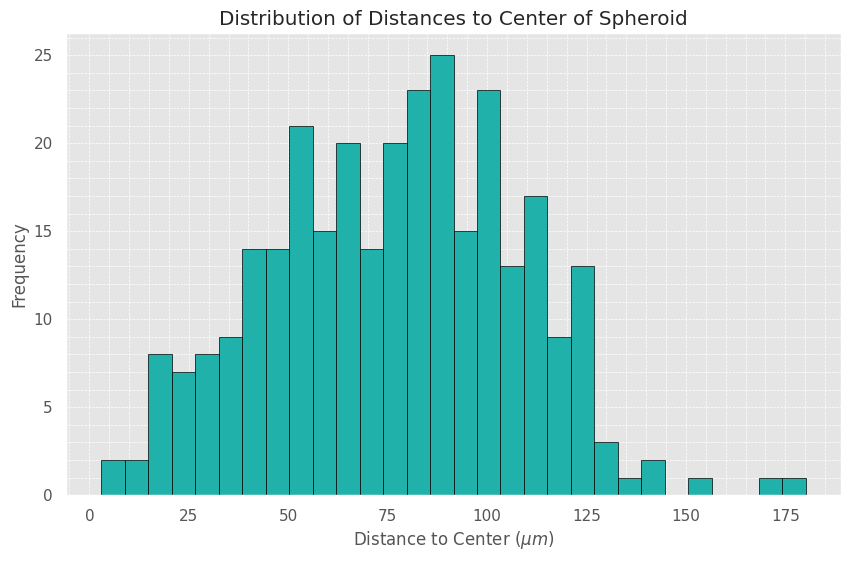

In [130]:
# Set the style of the plot
plt.style.use('ggplot')

# Plotting the distribution of distances in micrometers
plt.figure(figsize=(10, 6))
# plt.hist(df['distance_to_center_meters'], bins=30, color='skyblue', edgecolor='black')
plt.hist(df['distance_to_center_micrometers'], bins=30, color='lightseagreen', edgecolor='black')
plt.title('Distribution of Distances to Center of Spheroid')
plt.xlabel('Distance to Center ($\mu m$)')
plt.ylabel('Frequency')

# Adding the grid
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Showing x and y ticks
plt.minorticks_on()

plt.show()


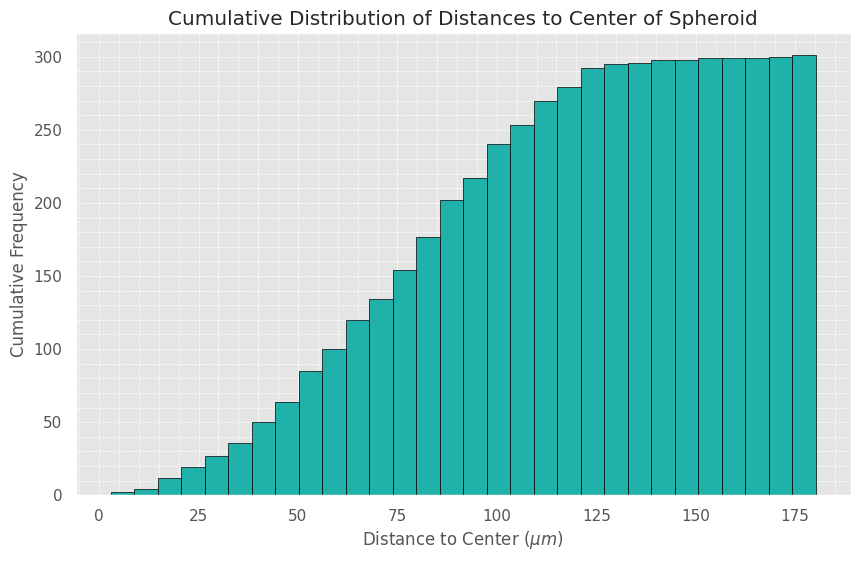

In [135]:
# Set the style of the plot
plt.style.use('ggplot')

# Plotting the cumulative distribution of distances in micrometers
plt.figure(figsize=(10, 6))
plt.hist(df['distance_to_center_micrometers'], bins=30, color='lightseagreen', edgecolor='black', cumulative=True)
plt.title('Cumulative Distribution of Distances to Center of Spheroid')
plt.xlabel('Distance to Center ($\mu m$)')
plt.ylabel('Cumulative Frequency')

# Adding the grid
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Showing x and y ticks
plt.minorticks_on()

plt.show()


### Delaunay Triangulation
> If you take each of the points from a Voronoi diagram and link it with the points in its neighboring cells, you will obtain a graph called the Delaunay triangulation. In mathematical terms, the Delaunay triangulation is the dual graph of the Voronoi diagram. ([Source.](https://builtin.com/data-science/voronoi-diagram))

In [149]:
df[['label', 'centroid-0', 'centroid-1', 'tails_cut_GMM_stemness']].head()

,label,centroid-0,centroid-1,tails_cut_GMM_stemness
0,1,3.36e+02,1.00e+03,0.00e+00
1,2,1.14e+03,7.26e+02,0.00e+00
2,3,1.30e+03,1.55e+03,0.00e+00
3,4,6.50e+02,6.10e+02,1.00e+00
4,5,3.43e+02,1.24e+03,0.00e+00


In [150]:
# Extract the centroids and labels
x = df['centroid-0'].values
y = df['centroid-1'].values
labels = df['label'].values
points = np.array([x, y]).T  # Transpose to get (x, y) pairs

# Create Delaunay triangulation
tri = Delaunay(points)

# Create a NetworkX graph
G = nx.Graph()

# Add nodes with the 'tails_cut_GMM_stemness' attribute and original labels from df
for label, point, stemness in zip(labels, points, df['tails_cut_GMM_stemness']):
    G.add_node(label, pos=(point[0], point[1]), tails_cut_GMM_stemness=stemness)

# Add edges from Delaunay triangulation
for simplex in tri.simplices:
    for i in range(3):
        for j in range(i + 1, 3):
            G.add_edge(labels[simplex[i]], labels[simplex[j]])


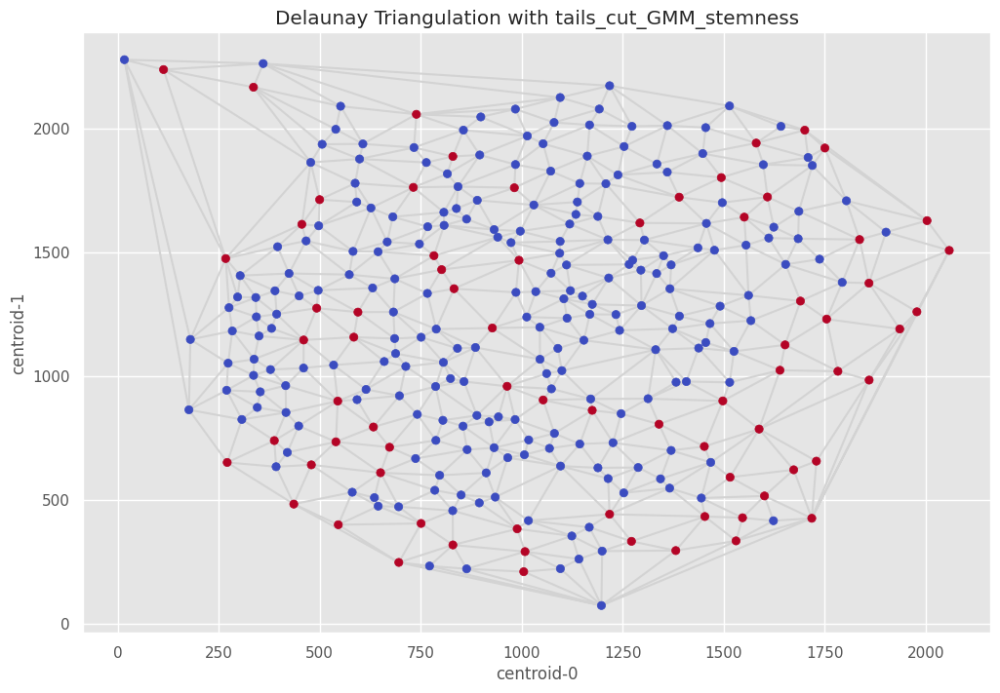

In [161]:

# Plotting settings
plt.figure(figsize=(12, 8), dpi=100)  # Increase plot size and DPI for better quality

# Plot Delaunay triangulation
plt.triplot(points[:, 0], points[:, 1], tri.simplices, color='lightgrey')
plt.scatter(points[:, 0], points[:, 1], c=df['tails_cut_GMM_stemness'], cmap='coolwarm')  # Color nodes based on 'tails_cut_GMM_stemness'
# plt.colorbar(label='tails_cut_GMM_stemness') # Colorbar shows the mapping from color to value 
# (1 -> stem -> red, 0 -> non-stem -> blue)
plt.title('Delaunay Triangulation with tails_cut_GMM_stemness')
plt.xlabel('centroid-0')
plt.ylabel('centroid-1')

plt.show()

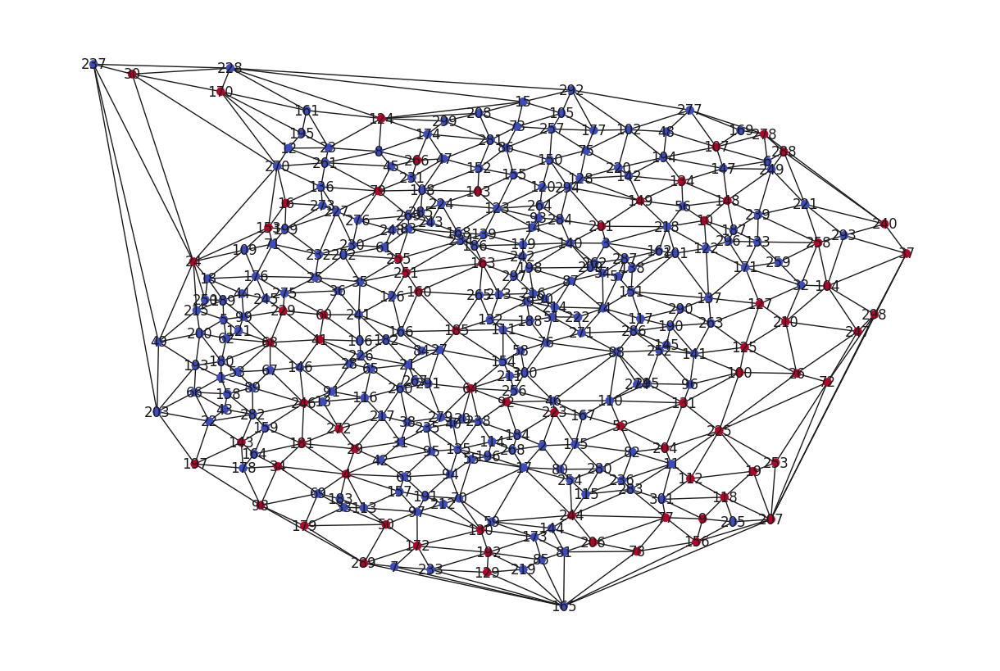

In [157]:
# Plotting settings
plt.figure(figsize=(12, 8), dpi=100)  # Increase plot size and DPI for better quality

# Draw the NetworkX graph
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, node_size=50, node_color=list(nx.get_node_attributes(G, 'tails_cut_GMM_stemness').values()), cmap='coolwarm', with_labels=True)
plt.show()

#### Ways of measuring heterogeneity of distribution of CSCs

##### Homophily
If the CSCs are not distributed homogeneously, it follows that there're regions with more stem cells than others. As the Delaunay triangulation reflects which cells are neighbors, having many (non) stem cells next to each other will result in network homophily (i.e., more connections between cells of the same type). We can measure homophily by calculating the proportion of edges that connect nodes with the same `'tails_cut_GMM_stemness'` value versus those that connect nodes with different values.

In [158]:
# Calculate homophily
same_stemness_edges = 0
different_stemness_edges = 0

for edge in G.edges():
    node1, node2 = edge
    if G.nodes[node1]['tails_cut_GMM_stemness'] == G.nodes[node2]['tails_cut_GMM_stemness']:
        same_stemness_edges += 1
    else:
        different_stemness_edges += 1

total_edges = same_stemness_edges + different_stemness_edges
homophily_ratio = same_stemness_edges / total_edges
heterophily_ratio = different_stemness_edges / total_edges

print("Homophily Ratio (Same stemness):", homophily_ratio)
print("Heterophily Ratio (Different stemness):", heterophily_ratio)


Homophily Ratio (Same stemness): 0.7170236753100339
Heterophily Ratio (Different stemness): 0.2829763246899662


**Assortativity** is a preference for a network's nodes to attach to others that are similar in some way. In this case, we want to evaluate if they prefer to attach to nodes with the same stemness. The assortativity coefficient measures the similarity of connections in the graph with respect to the node attribute. A high assortativity coefficient indicates homophily.

In [160]:
assortativity = nx.attribute_assortativity_coefficient(G, 'tails_cut_GMM_stemness')
print("Assortativity Coefficient:", assortativity)


Assortativity Coefficient: 0.2559085447675769


When $r = 1$, the network is said to have perfect assortative mixing patterns, when $r = 0$ the network is non-assortative, while at $r = −1$ the network is completely disassortative. Since stem cells are less than a quarter of the total of cells, we'd expect that the network would be more dissortative were stem cells distributed randomly.

*Note:* having so many DCCs, some homophily is to be expected. We need to quantify what is to be expected if stem cells were distributed randomly.

*To do:* to quantify what is to be expected, make a new graph of the same number of nodes, randomly select nodes to be the stem cells (such that they make up the same quantity of stem cells as here), and calculate this coefficient.

##### Connected Components
Otra cosa que uno ve a simple vista y da cuenta de la heterogeneidad de la distribución de madres, es que las (no) madres parecen formar clusters. Podemos analizar esto armando subgrafos y calculando el número de componentes conexas para cada uno.

Notar que el número de componentes conexas para las madres es 11, mucho menor al número de células madre (72 según este criterio). Si estuvieran distribuidas de manera completamente aleatoria, uno esperaría un número mayor de clusters.

In [159]:
# Create subgraphs for each stemness value
subgraph_0 = G.subgraph([n for n, attrdict in G.nodes(data=True) if attrdict['tails_cut_GMM_stemness'] == 0])
subgraph_1 = G.subgraph([n for n, attrdict in G.nodes(data=True) if attrdict['tails_cut_GMM_stemness'] == 1])

# Calculate connected components
connected_components_0 = nx.number_connected_components(subgraph_0)
connected_components_1 = nx.number_connected_components(subgraph_1)

print("Connected components (Stemness 0):", connected_components_0)
print("Connected components (Stemness 1):", connected_components_1)


Connected components (Stemness 0): 2
Connected components (Stemness 1): 11


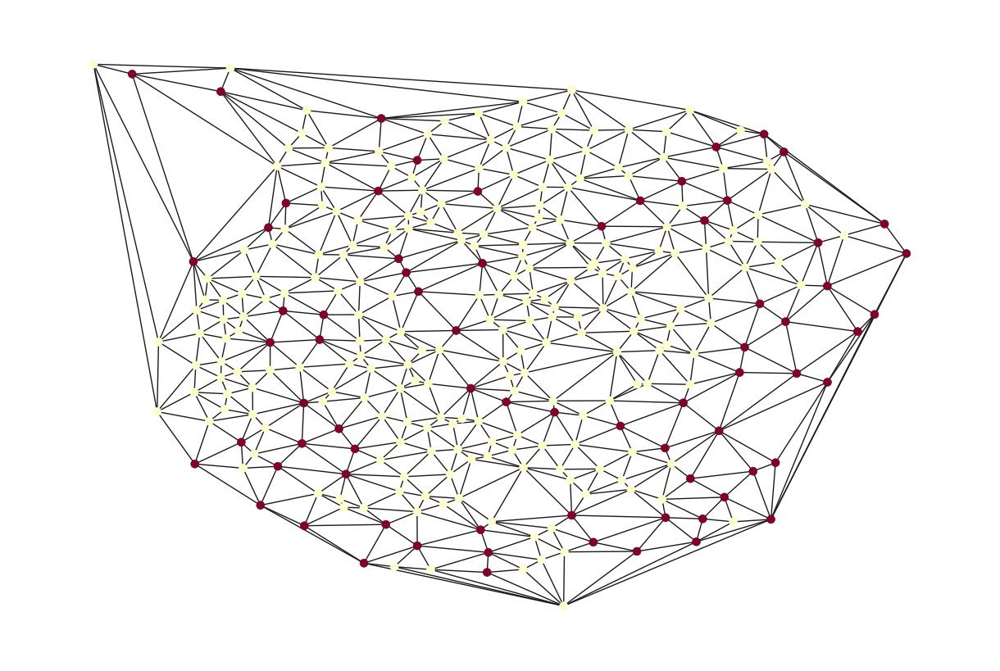

In [167]:
# Reds colormap for seeinng only stem cells (and identifying more easily their connected components)
# Plotting settings
plt.figure(figsize=(12, 8), dpi=100)  # Increase plot size and DPI for better quality

# Draw the NetworkX graph
pos = nx.get_node_attributes(G, 'pos')
nx.draw(G, pos, node_size=50, node_color=list(nx.get_node_attributes(G, 'tails_cut_GMM_stemness').values()), cmap='YlOrRd', with_labels=False)
plt.show()

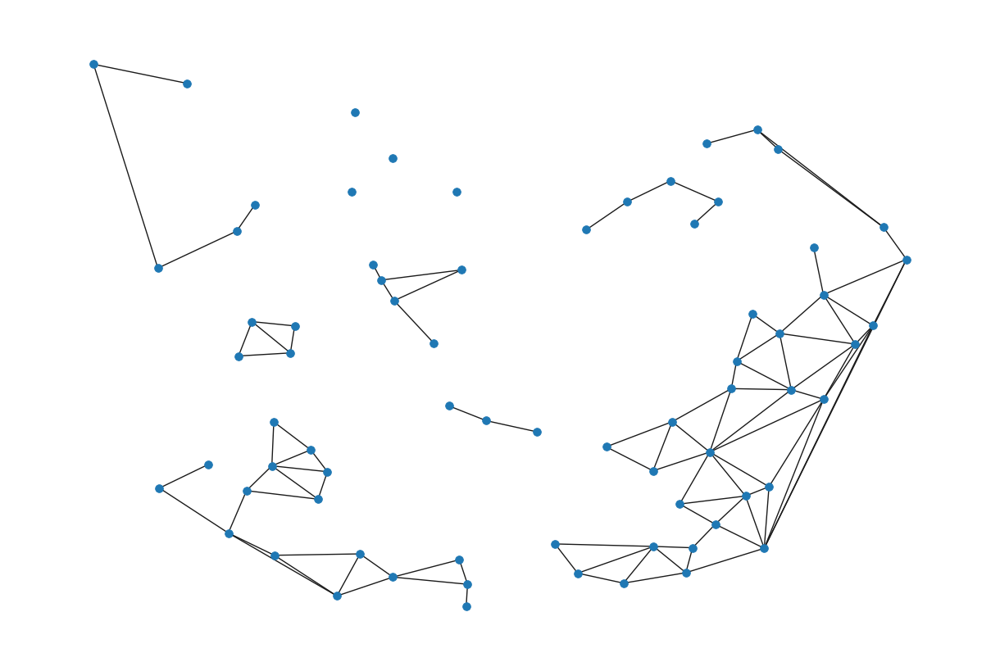

In [166]:
# Let's draw subgraph_1
# Plotting settings
plt.figure(figsize=(12, 8), dpi=100)  # Increase plot size and DPI for better quality

# Draw the NetworkX graph
pos = nx.get_node_attributes(subgraph_1, 'pos')
nx.draw(subgraph_1, pos, node_size=50, with_labels=False)
plt.show()